# Notebook 3: Sentinel-1 time-series analysis


This Notebook will take you through the steps of making and analyzing a timeseries 

## Preparations

1. Download this notebook and put it in its own directory
2. Download the data `delft_stack` by using this link https://surfdrive.surf.nl/s/SJirrMpqyLjXNTr 
(copy the path of the datafile or make sure to put it in the same directory as your notebook)

Activate environment:

`conda activate workshop-env`



In [2]:
import os
import numpy as np
# import sarxarray as sxr
import xarray as xr
import matplotlib.pyplot as plt

from scipy.spatial import Delaunay
# To work with sparse matrices when we unwrap
from scipy.sparse import csr_matrix
# To solve the linear set of equations
from scipy.sparse.linalg import lsqr
from scipy.interpolate import griddata
import scipy.io as spio

from tqdm import tqdm
from datetime import datetime

from drama import utils

import contextily as cx


Path location

In [3]:
track = 's1_asc_t088'

path= '/Users/isabelslingerland/insar-1/book/delft_stack.mat'

mat = spio.loadmat(path)
stack = mat['delft_stack']
days = mat['delft_days']
# path = os.path.join('/Users/plopezdekker/Documents/TEACHING/AESM402B-CIE4609_G&NH/Data/', track) 
# netcdf_file = os.path.join('/Users/plopezdekker/Documents/TEACHING/AESM402B-CIE4609_G&NH/Data', ("%s_v2.nc" % track))

# path = os.path.join('/Users/wietskebrouwer/surfdrive/Documents/PhD/06_onderwijs/insar_b_module/', track) 
# netcdf_file = os.path.join('/Users/wietskebrouwer/surfdrive/Documents/PhD/06_onderwijs/insar_b_module', ("%s_v2.nc" % track))

# s1_stack = xr.load_dataset(netcdf_file,engine="h5netcdf")




In [21]:
mat['delft_stack'].shape

(579, 2001, 21)

# Temporal mean of intensity


In [75]:
s1_stack

<xarray.Dataset> Size: 413MB
Dimensions:  (azimuth: 221, range: 898, time: 259)
Coordinates:
  * azimuth  (azimuth) int64 2kB 0 1 2 3 4 5 6 7 ... 214 215 216 217 218 219 220
  * range    (range) int64 7kB 0 1 2 3 4 5 6 7 ... 891 892 893 894 895 896 897
  * time     (time) datetime64[ns] 2kB 2018-02-22 2018-02-28 ... 2023-10-12
    lat      (azimuth, range) float32 794kB 53.12 53.12 53.12 ... 53.16 53.16
    lon      (azimuth, range) float32 794kB 6.421 6.421 6.421 ... 6.459 6.459
Data variables:
    complex  (azimuth, range, time) complex64 411MB (-68.32344-101.045j) ... ...

In [76]:
s1_complex = s1_stack.complex.values


Mean=29643.129777, std=2018702.961655


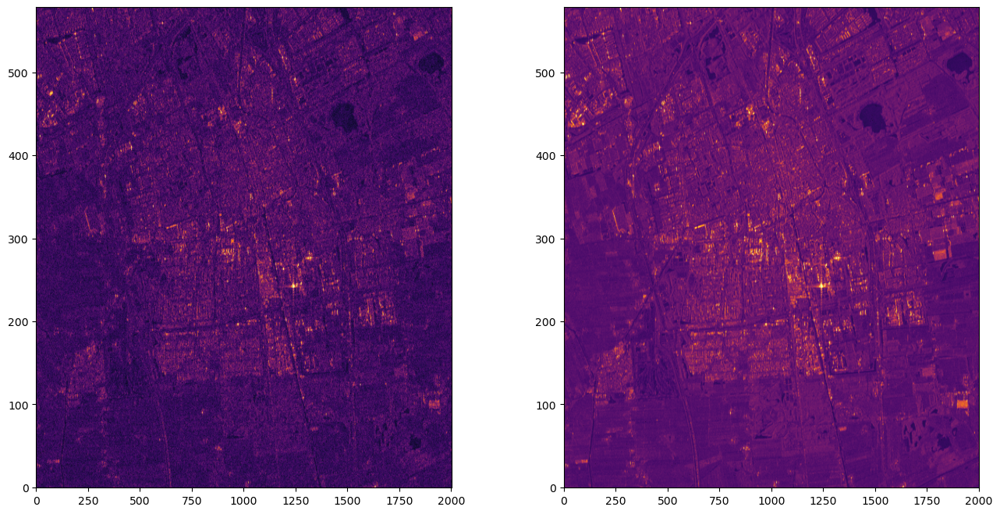

In [4]:
plt.figure(figsize=(16,8))
int0 = np.abs(stack[:,:,0])**2
int_tmpavg = np.mean(np.abs(stack)**2,axis=-1)
mean0 = np.mean(int0)
std0 = np.std(int0)
print("Mean=%f, std=%f" % (mean0, std0))
plt.subplot(1,2,1)
plt.imshow(int0**0.25, origin='lower', aspect=4, vmax=(mean0+2*std0)**0.25, cmap='inferno')
#plt.figure(figsize=(8,8))
plt.subplot(1,2,2)
plt.imshow(int_tmpavg**0.25, origin='lower', aspect=4, vmax=(mean0+1*std0)**0.25, cmap='inferno')


Mean=17627.908203, std=213482.140625


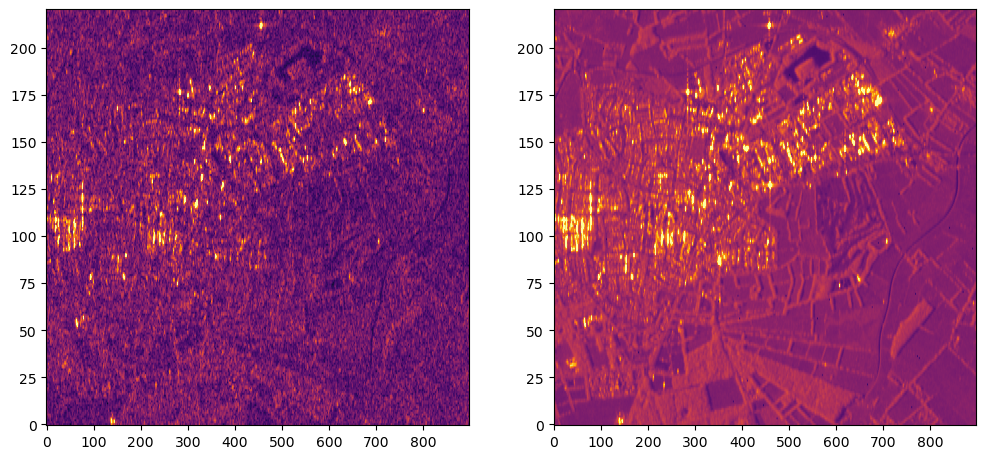

In [78]:
plt.figure(figsize=(12,6))
int0 = np.abs(s1_stack.complex.values[:,:,0])**2
int_tmpavg = np.mean(np.abs(s1_stack.complex.values)**2,axis=2)
mean0 = np.nanmean(int0)
std0 = np.std(int0)
print("Mean=%f, std=%f" % (mean0, std0))
plt.subplot(1,2,1)
plt.imshow(int0**0.25, origin='lower', aspect=4, vmax=(mean0+2*std0)**0.25, cmap='inferno')
#plt.figure(figsize=(8,8))
plt.subplot(1,2,2)
plt.imshow(int_tmpavg**0.25, origin='lower', aspect=4, vmax=(mean0+1*std0)**0.25, cmap='inferno')

In [79]:
lat = s1_stack.lat.values
lon = s1_stack.lon.values

In [80]:
lat

array([[53.12423 , 53.124233, 53.12424 , ..., 53.128654, 53.12866 ,
        53.128662],
       [53.12435 , 53.12436 , 53.124363, ..., 53.128777, 53.12878 ,
        53.128788],
       [53.124477, 53.12448 , 53.12449 , ..., 53.1289  , 53.128902,
        53.12891 ],
       ...,
       [53.151024, 53.151028, 53.15103 , ..., 53.155445, 53.15545 ,
        53.155457],
       [53.151146, 53.15115 , 53.151154, ..., 53.155567, 53.155575,
        53.15558 ],
       [53.151268, 53.15127 , 53.151276, ..., 53.15569 , 53.155697,
        53.1557  ]], dtype=float32)

/var/folders/1s/7x269xkj6tsb6njsjtxkdyhc74zm8s/T/ipykernel_20197/656924150.py:4: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  plt.pcolormesh(lon, lat, int0**0.25, shading='auto', cmap='inferno', vmax=(mean0 + 2 * std0)**0.25, alpha = 0.85)
/var/folders/1s/7x269xkj6tsb6njsjtxkdyhc74zm8s/T/ipykernel_20197/656924150.py:13: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  plt.pcolormesh(lon, lat, int_tmpavg**0.25, shading='auto', cmap='inferno', vmax=(mean0 + 1 * std0)**0.25, alpha = 0.85)
/var/folders/1s/7x269xkj6tsb6njsjtxkdyhc74zm8s/T/ipykernel_20197/656924150.py:23: UserWarning: The 

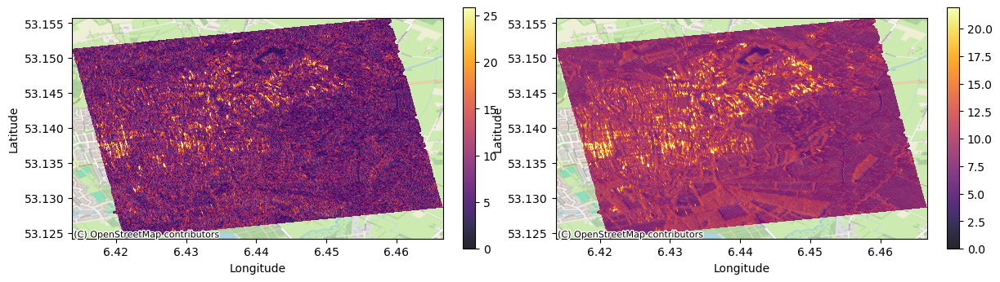

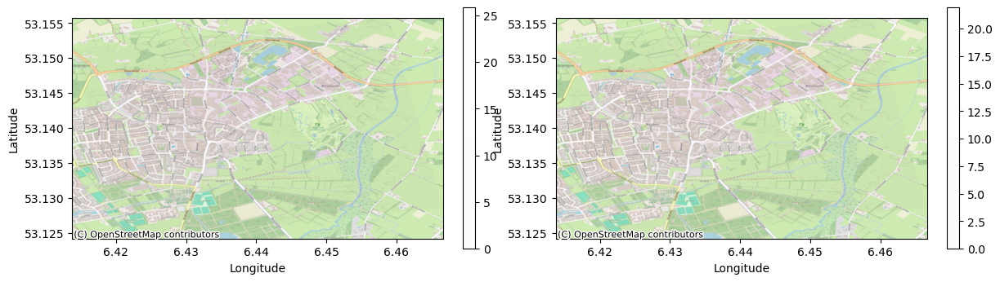

In [44]:
plt.figure(figsize=(14,6))

ax1 = plt.subplot(1, 2, 1)
plt.pcolormesh(lon, lat, int0**0.25, shading='auto', cmap='inferno', vmax=(mean0 + 2 * std0)**0.25, alpha = 0.85)
plt.colorbar(fraction = 0.03)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
cx.add_basemap(ax1, crs='epsg:4326', source=cx.providers.OpenStreetMap.Mapnik, zoom = 15)


# Tweede subplot
ax2 = plt.subplot(1, 2, 2)
plt.pcolormesh(lon, lat, int_tmpavg**0.25, shading='auto', cmap='inferno', vmax=(mean0 + 1 * std0)**0.25, alpha = 0.85)
plt.colorbar(fraction = 0.03)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
cx.add_basemap(ax2, crs='epsg:4326', source=cx.providers.OpenStreetMap.Mapnik, zoom = 15)


plt.figure(figsize=(14,6))

ax1 = plt.subplot(1, 2, 1)
plt.pcolormesh(lon, lat, int0**0.25, shading='auto', cmap='inferno', vmax=(mean0 + 2 * std0)**0.25, alpha = 0.01)
plt.colorbar(fraction = 0.03)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
cx.add_basemap(ax1, crs='epsg:4326', source=cx.providers.OpenStreetMap.Mapnik, zoom = 15)


# Tweede subplot
ax2 = plt.subplot(1, 2, 2)
plt.pcolormesh(lon, lat, int_tmpavg**0.25, shading='auto', cmap='inferno', vmax=(mean0 + 1 * std0)**0.25, alpha = 0.01)
plt.colorbar(fraction = 0.03)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
cx.add_basemap(ax2, crs='epsg:4326', source=cx.providers.OpenStreetMap.Mapnik, zoom = 15)



## Amplitude calibration
We should check that the data is calibrated in amplitude, or trust that it is. One way is to check the mean intensity at different epochs. Calculate and plot the intensity over time, in dB
$$
   I_{dB,i} = 10 \cdot log_{10}\left(\frac{<I>_i}{max_i(<I>_i)}\right)
$$

__Is the amplitude stable?__

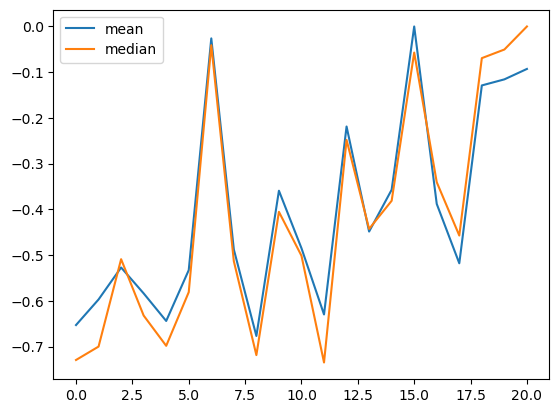

In [5]:
# Make your plot here
#A_all = np.abs(s1_stack.complex.values)
A_all = np.abs(stack)
mean_A = np.mean(np.mean(A_all, axis=0), axis=0)
median_A = np.median(A_all.reshape((int(A_all.size/A_all.shape[2]), A_all.shape[2])), axis=0)
plt.figure()
plt.plot(10*np.log10(mean_A/mean_A.max()), label = 'mean')
plt.plot(10*np.log10(median_A/median_A.max()), label = 'median')
plt.legend()

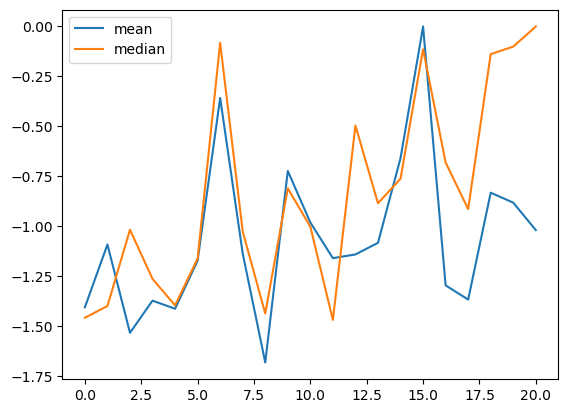

In [6]:
# Make your plot here

#int_all = np.abs(s1_stack.complex.values)**2
int_all = np.abs(stack)**2
mean_int = np.mean(np.mean(int_all, axis=0), axis=0)
median_int = np.median(int_all.reshape((int(int_all.size/int_all.shape[2]), int_all.shape[2])), axis=0)
plt.figure()
plt.plot(10*np.log10(mean_int/mean_int.max()), label = 'mean')
plt.plot(10*np.log10(median_int/median_int.max()), label = 'median')
plt.legend()

If it is not stable enough you should scale the data accordingly. For example, you could divide each image by the square root of the mean intensity
$$
  SLC_{i,cal} = SLC_i/<I>_i
$$
But maybe let us first compute the amplitude dispersion. As seen in class, this is computed as
$$
D_a = \frac{\sigma_a}{m_a}
$$
where $\sigma_a$ and $m_a$ are the standard deviation and mean of the amplitude of each pixel over time, respectively.

__Compute and represent the amplitude dispersion, with and without amplitude calibration__
(Use the code provided for plotting)

In [7]:
# Compute the amplitude dispersion
#stack_amps = np.abs(s1_stack.complex.values)
stack_amps = np.abs(stack)
Da = np.std(stack_amps, axis=-1)/np.mean(stack_amps, axis=-1)
amp_cal = stack_amps / np.sqrt(mean_int).reshape((1,1,stack_amps.shape[2]))
Da_cal = np.std(amp_cal, axis=-1)/np.mean(amp_cal, axis=-1)


/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_53032/2644676618.py:4: RuntimeWarning: invalid value encountered in divide
  Da = np.std(stack_amps, axis=-1)/np.mean(stack_amps, axis=-1)
/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_53032/2644676618.py:6: RuntimeWarning: invalid value encountered in divide
  Da_cal = np.std(amp_cal, axis=-1)/np.mean(amp_cal, axis=-1)


In [8]:
np.shape(np.std(stack_amps, axis=-1))

(579, 2001)

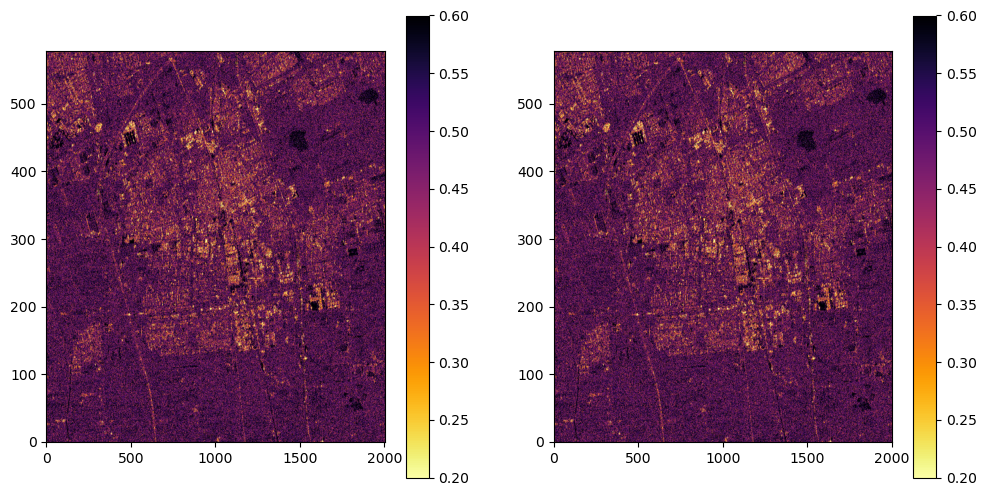

In [9]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(Da, origin='lower', aspect=4, cmap='inferno_r',vmin=0.2, vmax=0.6)
plt.colorbar()
#plt.figure(figsize=(8,8))
plt.subplot(1,2,2)
plt.imshow(Da_cal, origin='lower', aspect=4, cmap='inferno_r', vmin=0.2, vmax=0.6)
plt.colorbar()

Now you want to select possible PS by choosing points with $D_a$ below a certain threshold. For this, the `np.where` function is our friend. Find the positions of the PS candiates setting the threshold to 0.25. See how many points we select. Does the calibration make a difference?

In [11]:
Da_threshold = 0.25
ps_pos = np.where(Da < Da_threshold)
ps_cal_pos = np.where(Da_cal < Da_threshold)
print(ps_pos[0].shape)
print(ps_cal_pos[0].shape)

ps_pos, ps_cal_pos

# ps_lat = lat[ps_cal_pos]
# ps_lon = lon[ps_cal_pos]

(14654,)
(15169,)


((array([  0,   0,   0, ..., 578, 578, 578], shape=(14654,)),
  array([ 413,  414,  622, ..., 1841, 1842, 1847], shape=(14654,))),
 (array([  0,   0,   0, ..., 578, 578, 578], shape=(15169,)),
  array([ 413,  414,  622, ..., 1841, 1842, 1847], shape=(15169,))))

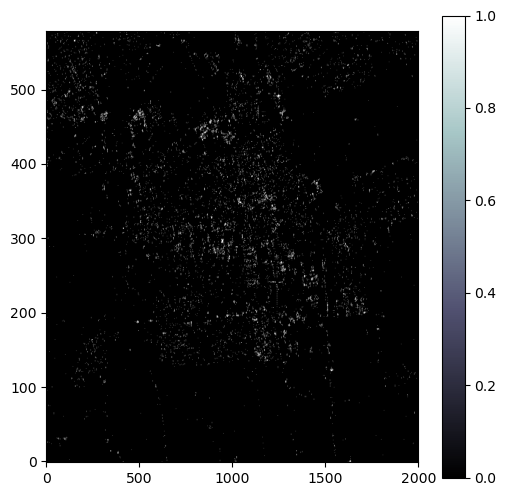

In [12]:
ax = plt.figure(figsize=(6,6))
plt.imshow(Da_cal < Da_threshold, origin='lower', aspect=4, cmap='bone')
plt.colorbar()



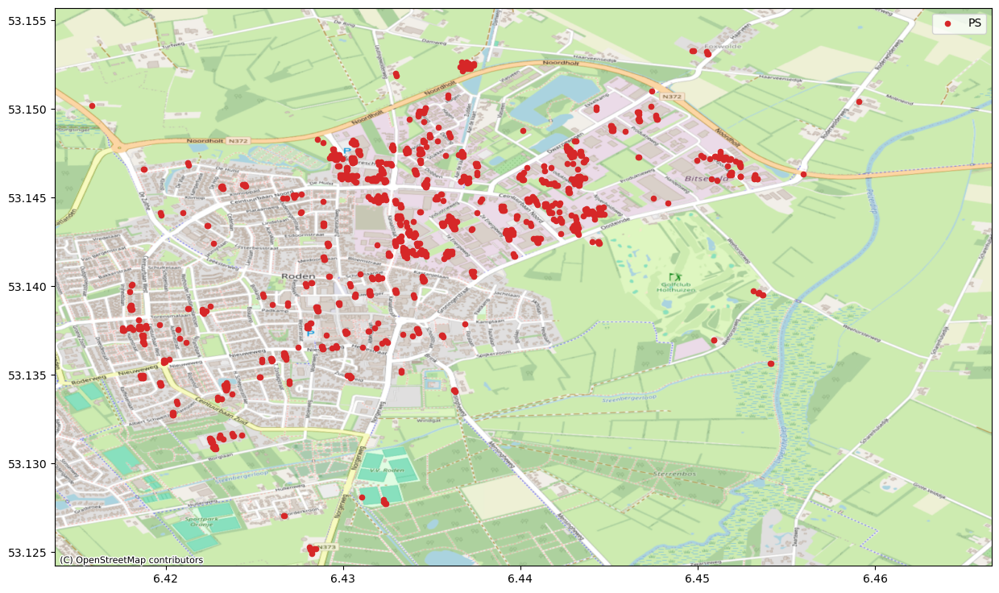

In [52]:
fig, ax = plt.subplots(figsize = (15,15))
plt.scatter(ps_lon, ps_lat, s=20, color = 'tab:red', label = 'PS')
plt.legend()
plt.ylim(np.min(lat), np.max(lat))
plt.xlim(np.min(lon), np.max(lon))
cx.add_basemap(ax, crs='epsg:4326', source=cx.providers.OpenStreetMap.Mapnik, zoom = 15)

Now we triangulate the points using Delaunay. I have created a `tri2arcs` function that extracts unique arcs from the Delaunay triangulation.

In [13]:
points = np.array(ps_cal_pos).T
points.shape
tri = Delaunay(points * np.array([4,1]).reshape((1,2)))
def tri2arcs(dela):
    ntr = dela.simplices.shape[0]
    arcs = np.zeros((ntr,3,2))
    arcs[:,0,0] = dela.simplices[:,0]
    arcs[:,0,1] = dela.simplices[:,1]
    arcs[:,1,0] = dela.simplices[:,1]
    arcs[:,1,1] = dela.simplices[:,2]
    arcs[:,2,0] = dela.simplices[:,2]
    arcs[:,2,1] = dela.simplices[:,0]
    # sort them by last index and then by first
    arcs = arcs.reshape((ntr*3, 2))
    arcs = np.sort(arcs, axis=1)
    dtype = arcs.dtype.descr * 2  # some code found in stackoverflow:
    # https://stackoverflow.com/questions/16970982/find-unique-rows-in-numpy-array
    struct = arcs.view(dtype)
    uniq = np.unique(struct)
    uniq = uniq.view(arcs.dtype).reshape(-1, 2)
    return uniq

In [15]:
# Unique arcs between points in Delaunay triangulation
arcs = tri2arcs(tri).astype(np.int32)
print(arcs.shape)
#Da[points[arcs[100:110,0],0], points[arcs[100:110,0],1]]
# azimuth index  for begin of arc
az_1 = points[arcs[:,0] ,0]
# azimuth index  for end of arc
az_2 = points[arcs[:,1] ,0]
# etc
rg_1 = points[arcs[:,0] ,1]
rg_2 = points[arcs[:,1] ,1]
print(az_1.shape)
# complex values time-series for selected points
#slc_points = s1_stack.complex.values[points[:, 0], points[:, 1]]
slc_points = stack[points[:, 0], points[:, 1]]
Da_points = Da_cal[points[:, 0], points[:, 1]]
print(slc_points.shape)

(45441, 2)
(45441,)
(15169, 21)


In [55]:
len(ps_lon)

993

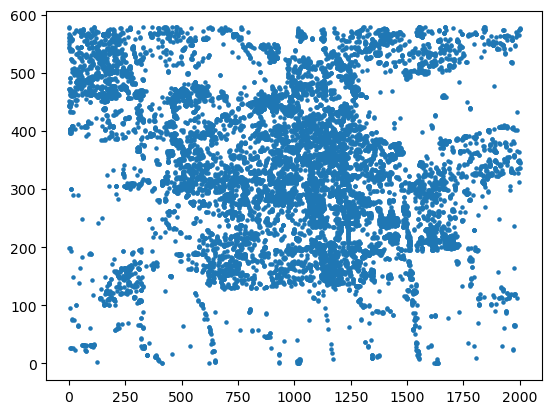

In [16]:
points, points[:,0], points[:,1], np.shape(points)

plt.scatter(points[:,1], points[:,0], s = 5)

In [57]:
arcs

array([[  0,   1],
       [  0,   2],
       [  0,   4],
       ...,
       [989, 992],
       [990, 992],
       [991, 992]], dtype=int32)

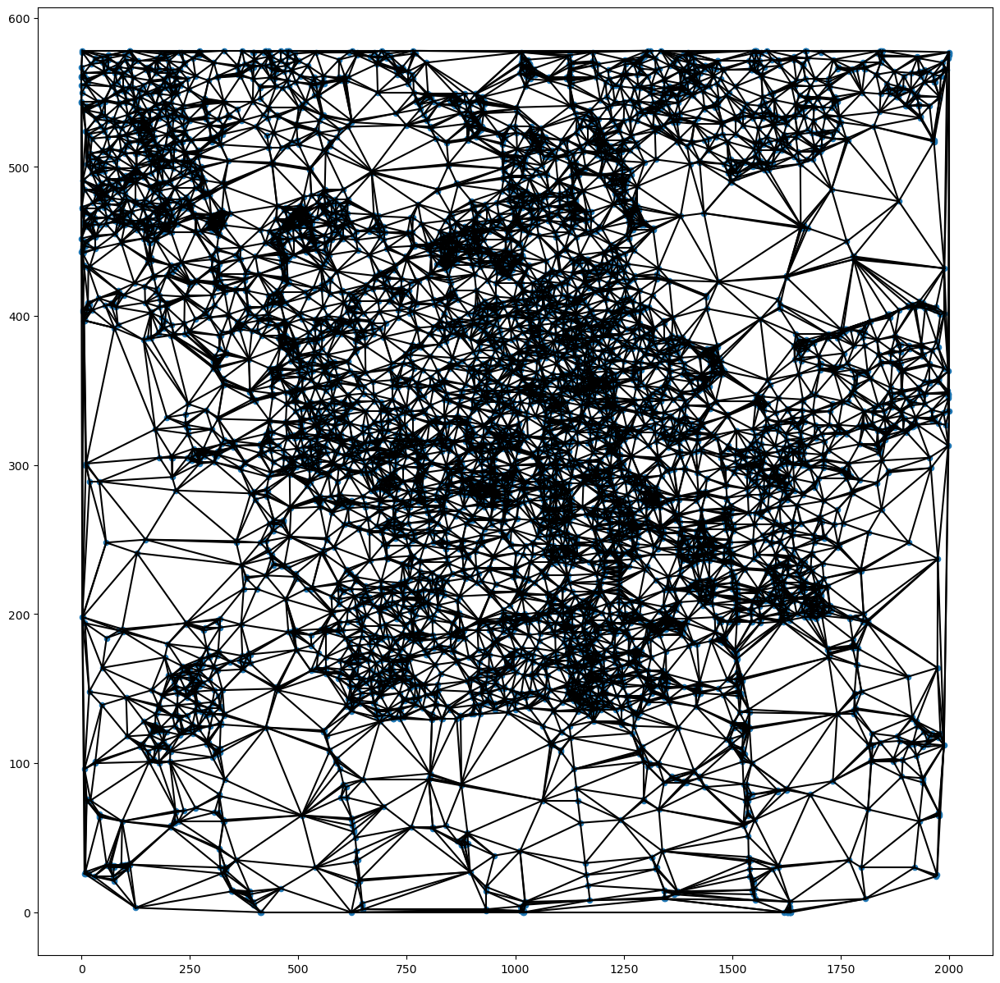

In [17]:


fig, ax = plt.subplots(figsize = (15,15))

for i in range(len(arcs)):
    pnt1 = arcs[i][0]
    pnt1_idx = points[pnt1]
    

    pnt2 = arcs[i][1]
    pnt2_idx = points[pnt2]
    
    
    
    
    plt.plot([pnt1_idx[1], pnt2_idx[1]], [pnt1_idx[0], pnt2_idx[0]], color = 'k')
plt.scatter(points[:,1], points[:,0], s = 20)


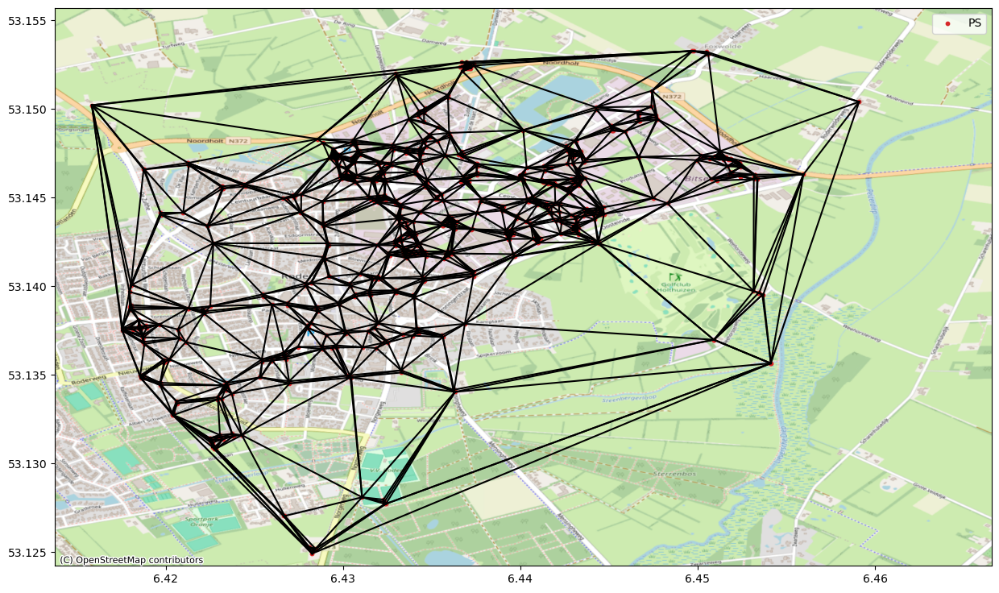

In [59]:


fig, ax = plt.subplots(figsize = (15,15))

for i in range(len(arcs)):
# for i in range(20):
    pnt1 = arcs[i][0]
    pnt1_idx = points[pnt1]

    lat1 = lat[pnt1_idx[0], pnt1_idx[1]]
    lon1 = lon[pnt1_idx[0], pnt1_idx[1]]
    

    pnt2 = arcs[i][1]
    pnt2_idx = points[pnt2]

    lat2 = lat[pnt2_idx[0], pnt2_idx[1]]
    lon2 = lon[pnt2_idx[0], pnt2_idx[1]]
    
  
    
    plt.plot([lon1, lon2], [lat1, lat2], color = 'k')
plt.scatter(ps_lon, ps_lat, s=10, color = 'tab:red', label = 'PS')
plt.legend()
plt.ylim(np.min(lat), np.max(lat))
plt.xlim(np.min(lon), np.max(lon))
cx.add_basemap(ax, crs='epsg:4326', source=cx.providers.OpenStreetMap.Mapnik, zoom = 15)

## Phase reference
As you know, the phase of the SLCs are random and floating (we have no reference). In order to do anything with the time series we need to choose a reference point. Typically you would look for a point with low $D_a$ that you believe to be stable. In the code below I am selecting the point with the lowest amplitude dispersion, but this may be a very poor choice.

In [60]:
# We need a reference phase
# Best point, according to Da, take it as reference
best_ind = Da_points.argmin() 
print("Reference position= %i, %i" % (points[best_ind, 0], points[best_ind, 1]))
ref_value = slc_points[best_ind]
# Remove reference phase:
print(slc_points.shape)
slc_points = slc_points * np.exp(-1j * np.angle(ref_value)).reshape((1, ref_value.size))
ref_value.shape

Reference position= 175, 377
(993, 259)


(259,)

In [61]:
#np.angle(slc_points[best_ind])

## Interferogram creation
Now we are creating the interferograms. This could have been done already with the images, but since I did not let us do it with the selected pixels. We can do a daisy chain (interfering consecutive epochs) or we can use one common master.

In [62]:
# Daisy chain phasors
interf = slc_points[:, 0:-1] * np.conj(slc_points[:,1:])
np.std(np.angle(interf))

0.6826813

In [63]:
np.shape(slc_points[:, 0:-1])

(993, 258)

## Double phase differences between at arcs

In [64]:
# Your code here:
arc_phasor = interf[arcs[:,1]] * np.conj(interf[arcs[:,0]])
arc_phase = np.angle(arc_phasor)
arc_avg_phase = np.angle(np.mean(arc_phasor, axis=1))
arc_avg_phase.shape
arc_phase_uw = np.cumsum(arc_phase, axis=-1)
arc_phasor.shape

(2965, 258)

In [65]:
np.shape(arc_phasor)

(2965, 258)

In [66]:
arcs

array([[  0,   1],
       [  0,   2],
       [  0,   4],
       ...,
       [989, 992],
       [990, 992],
       [991, 992]], dtype=int32)

IndexError: index 7000 is out of bounds for axis 0 with size 2965

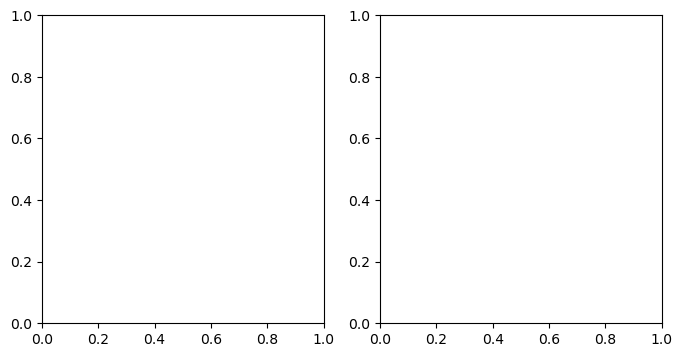

In [67]:
fig, axs = plt.subplots(1,2, figsize=(8, 4))
arcn = 201
for arcn in [7000,10000, 12000]:
    axs[0].plot(arc_phase[arcn,:],'.')
    axs[1].plot(arc_phase_uw[arcn,:],'.')

## Set up a sparse system of equations to unwrap

In [68]:
neq = arcs.shape[0]
npt = points.shape[0]
eqs = np.concatenate((np.ones(neq+1), -1*np.ones(neq)))
rows = np.concatenate((np.array([0]), 1+np.arange(neq), 1+np.arange(neq)))
cols = np.concatenate((np.array([best_ind]), arcs[:,1], arcs[:,0]))
rows.shape


(5931,)

In [70]:
len(arcs), npt

(2965, 993)

In [72]:
np.shape(arcs)

(2965, 2)

In [174]:
A = csr_matrix((eqs,(rows,cols)), shape=(neq+1,npt))


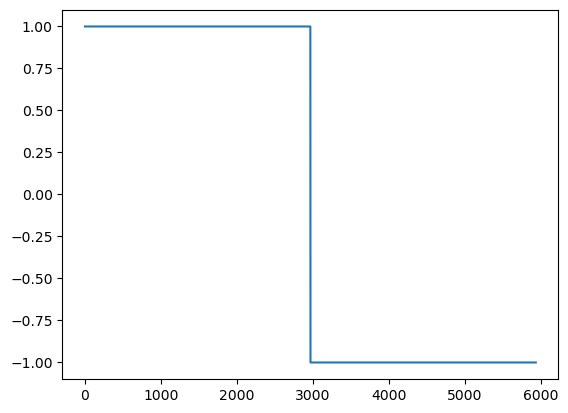

In [177]:
np.shape(A)
plt.plot(eqs)

In [180]:
A = csr_matrix((eqs,(rows,cols)), shape=(neq+1,npt))
#, shape=(npt,npt)
ls_phase = lsqr(A,np.concatenate((np.array([0]),arc_avg_phase)))[0]

ls_phase_n = lsqr(A,np.concatenate((np.array([0]),arc_phase[:,0])))[0]
ls_phase_uwts = np.stack([np.zeros_like(ls_phase_n), ls_phase_n])

np.shape(ls_phase), np.shape(ls_phase_n)

((993,), (993,))

In [181]:
np.shape(arc_phase)

(2965, 258)

In [182]:
for ind in range(1, arc_phase.shape[1]):
    ls_phase_ind = lsqr(A,np.concatenate((np.array([0]),arc_phase[:,ind])))[0]
    ls_phase_n = ls_phase_n + ls_phase_ind
    ls_phase_uwts = np.concatenate([ls_phase_uwts, ls_phase_n.reshape((1,ls_phase_ind.size))], axis=0)
    
ls_phase_uw = lsqr(A,np.concatenate((np.array([0]),arc_phase_uw[:,-1])))[0]


In [188]:
dates = s1_stack.time.values

/var/folders/1s/7x269xkj6tsb6njsjtxkdyhc74zm8s/T/ipykernel_34638/576210375.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


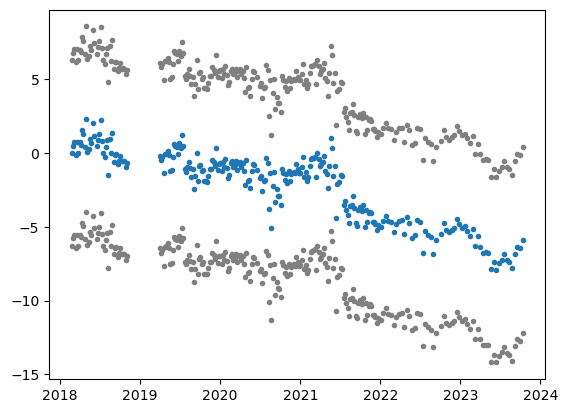

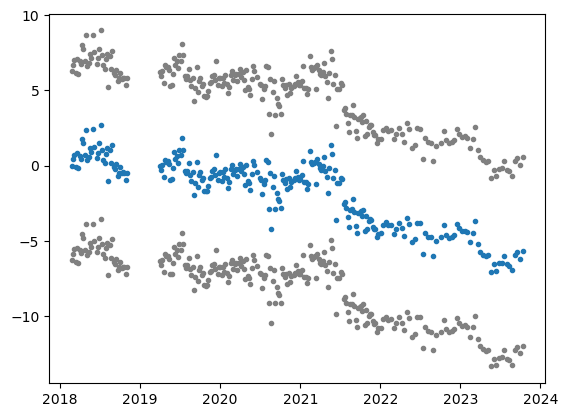

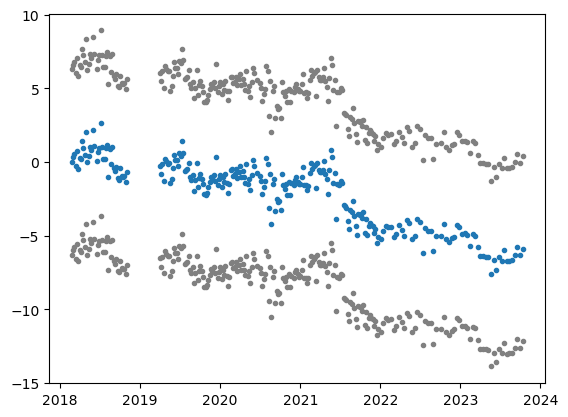

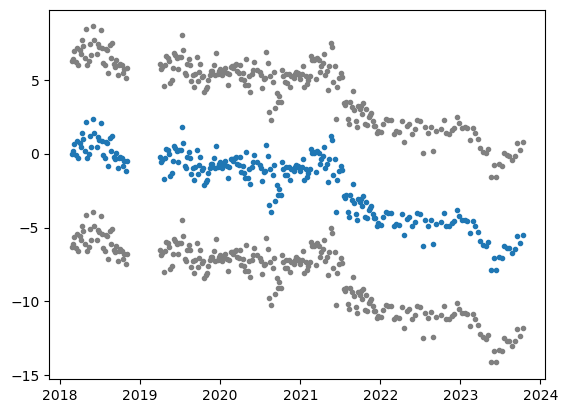

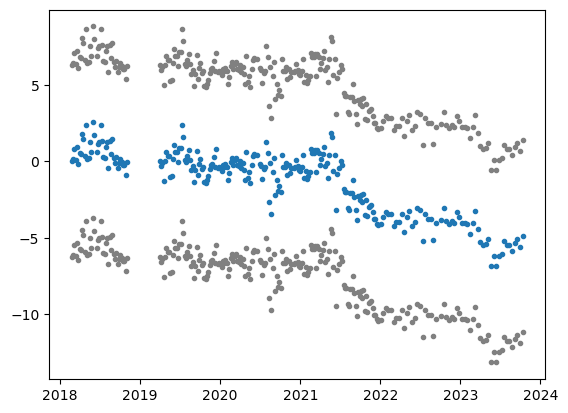

...

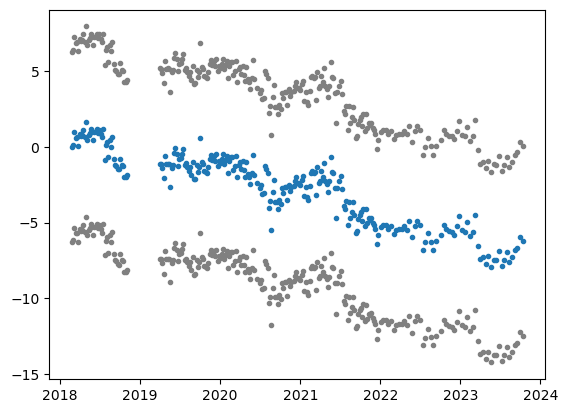

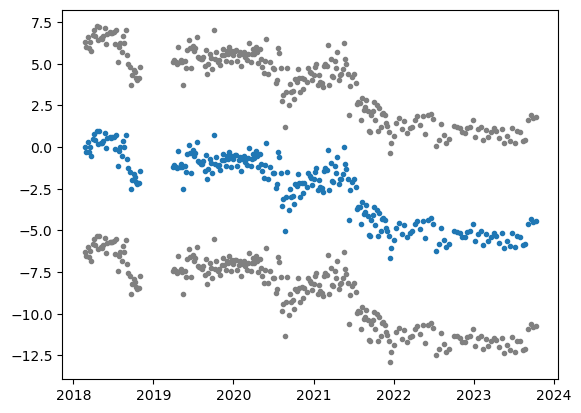

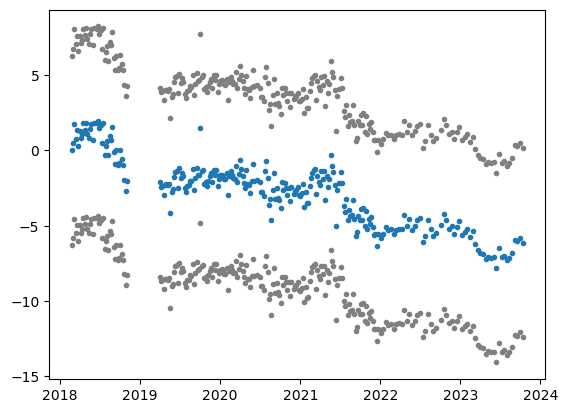

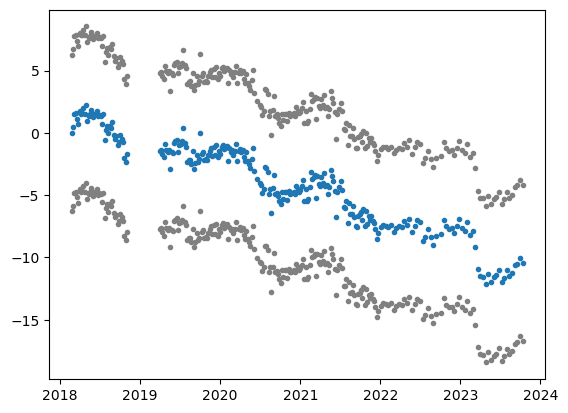

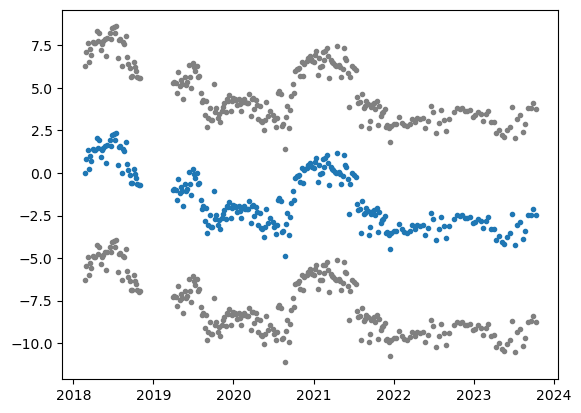

In [189]:
for i in range(50):
    plt.figure()
    plt.plot(dates, ls_phase_uwts[:, i], '.')
    plt.plot(dates, ls_phase_uwts[:, i] + 2*np.pi, '.', color = 'gray' )
    plt.plot(dates, ls_phase_uwts[:, i] - 2*np.pi, '.', color = 'gray')


(993, 2)
(993, 258)
2.6848965939171974
-1.4854471331655117


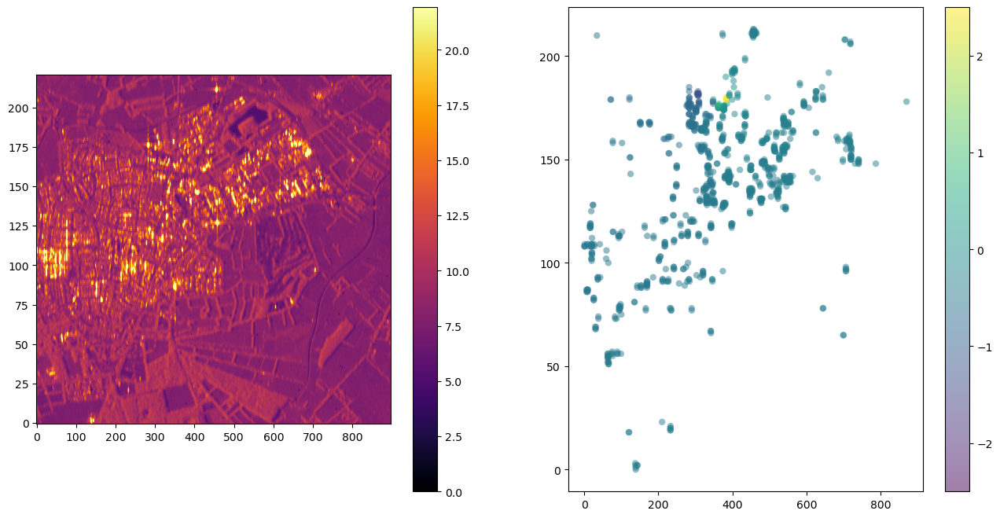

In [190]:
plt.figure(figsize=(16,8))
plt.subplot(1,2,1)
plt.imshow(int_tmpavg**0.25, origin='lower', aspect=4, vmax=(mean0+1*std0)**0.25, cmap='inferno')
plt.colorbar()
print(points.shape)
print(interf.shape)
plt.subplot(1,2,2)
# plt.pcolormesh(points[:, 1], points[:, 0],np.angle(interf[:,0]))
from scipy.interpolate import griddata
interp_lsphase = griddata((points[:,1],points[:,0]), ls_phase,
                          (np.arange(int0.shape[1])[None,:],np.arange(int0.shape[0])[:,None]))
#plt.tricontourf(points[:, 1], points[:, 0],ls_phase,101, aspect=4, origin='lower', cmap='jet', vmin=-5, vmax=5)
# plt.imshow(interp_lsphase,aspect=4, origin='lower', cmap='jet', vmin=-3, vmax=3)
plt.scatter(points[:,1],points[:,0], c=ls_phase, edgecolors='none', vmin=-2.5, vmax=2.5, alpha=0.5)
print(ls_phase.max())
print(ls_phase.min())
plt.colorbar()

[ 0.34390771  0.13654052  1.74575551 ... -0.17136857 -0.95447863
  0.0968076 ]


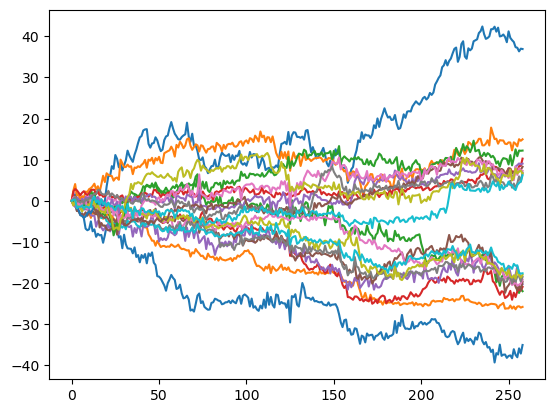

In [75]:
indmin = np.argsort((ls_phase_n))
indmax = np.argsort(-1*(ls_phase_n))
indminabs = np.argsort(np.abs(ls_phase_n))[1]
print(ls_phase[indmax])
plt.figure()
for ind in indmin[0:100:10]:
    plt.plot(ls_phase_uwts[:,ind])
for ind in indmax[0:100:10]:
    plt.plot(ls_phase_uwts[:,ind])

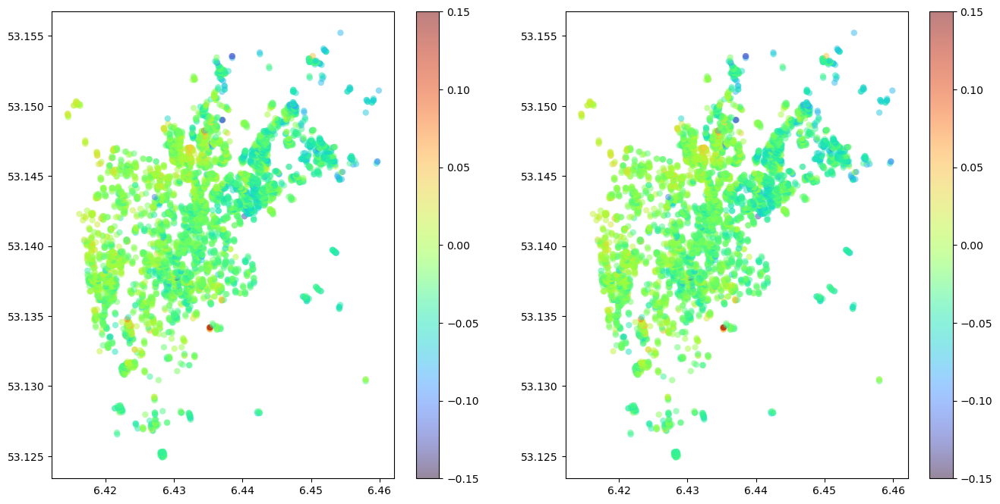

In [76]:
vmin = -0.15
vmax = 0.15
pointlons = s1_stack.lon.values[points[:,0],points[:,1]]
pointlats = s1_stack.lat.values[points[:,0],points[:,1]]
plt.figure(figsize=(16,8))
plt.subplot(1,2,1)
plt.scatter(pointlons,pointlats, c=ls_phase_n/int_all.shape[-1], edgecolors='none', vmin=vmin, vmax=vmax, alpha=0.5, cmap='turbo')
plt.colorbar()
#plt.figure(figsize=(16,8))
plt.subplot(1,2,2)
plt.scatter(pointlons,pointlats, c=ls_phase_uwts[-1]/int_all.shape[-1], edgecolors='none', vmin=vmin, vmax=vmax, alpha=0.5, cmap='turbo')
plt.colorbar()

# Test single master approach

In [192]:
np.shape(slc_points)

(993, 259)

In [195]:
dates[170]

numpy.datetime64('2021-05-25T00:00:00.000000000')

(993, 259)

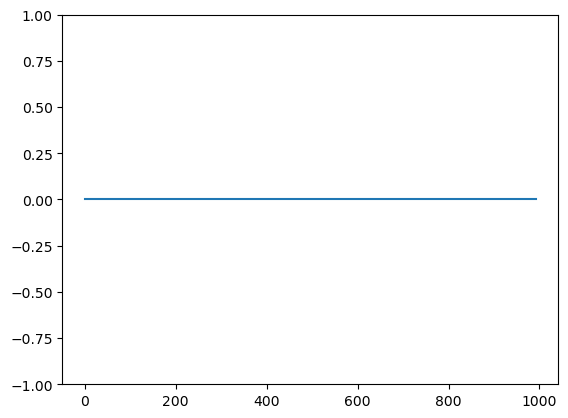

In [205]:
# Define master epoch and compute single-master stack 
idx_master = 170
interf_master = slc_points * np.conj(slc_points[:, idx_master][:, np.newaxis])

# Phase at the master epoch should be zero. Check
plt.plot(np.angle(interf_master[:, idx_master]))
plt.ylim(-1,1)

np.shape(interf_master)

In [204]:
# We need a reference phase
# Best point, according to Da, take it as reference
best_ind = Da_points.argmin() 
print("Reference position= %i, %i" % (points[best_ind, 0], points[best_ind, 1]))
ref_value = slc_points[best_ind]
# Remove reference phase:
print(slc_points.shape)
slc_points = slc_points * np.exp(-1j * np.angle(ref_value)).reshape((1, ref_value.size))
ref_value.shape

Reference position= 175, 377
(993, 259)


(259,)

In [207]:
arcs[:,1],arcs[:,0]

(array([  1,   2,   4, ..., 992, 992, 992], dtype=int32),
 array([  0,   0,   0, ..., 989, 990, 991], dtype=int32))

In [208]:
# Your code here:
arc_phasor = interf_master[arcs[:,1]] * np.conj(interf_master[arcs[:,0]])
arc_phase = np.angle(arc_phasor)
arc_avg_phase = np.angle(np.mean(arc_phasor, axis=1))
arc_avg_phase.shape
arc_phase_uw = np.cumsum(arc_phase, axis=-1)
arc_phasor.shape

(2965, 259)

0


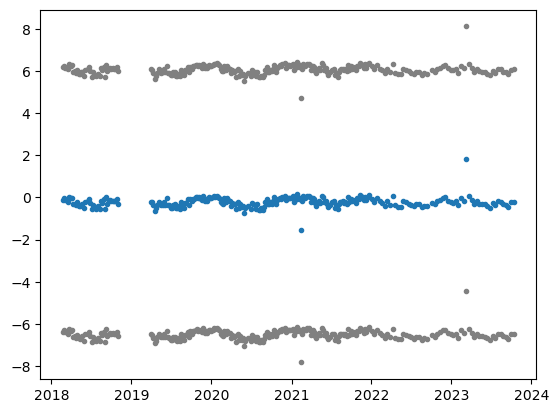

1


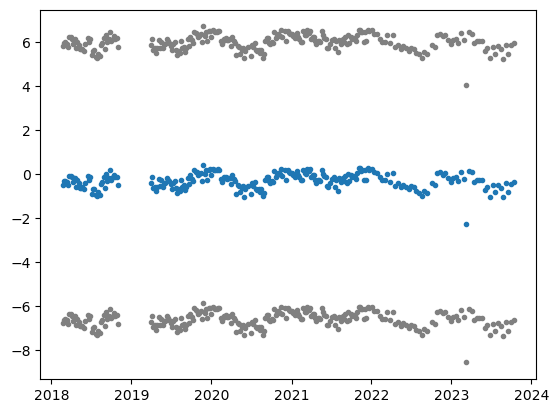

2


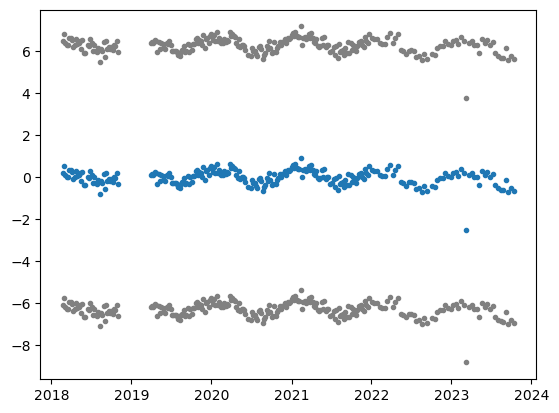

3


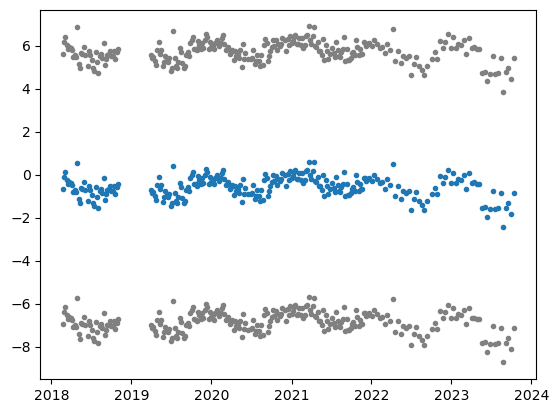

4


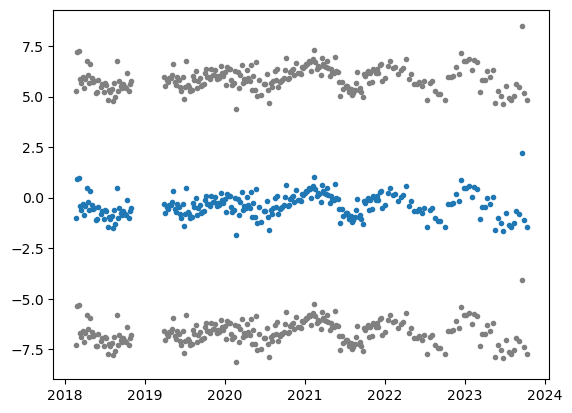

5


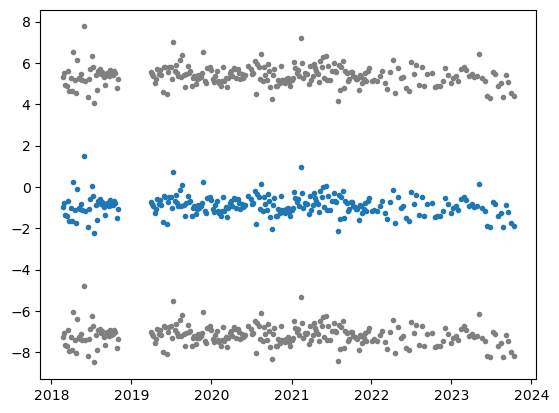

6


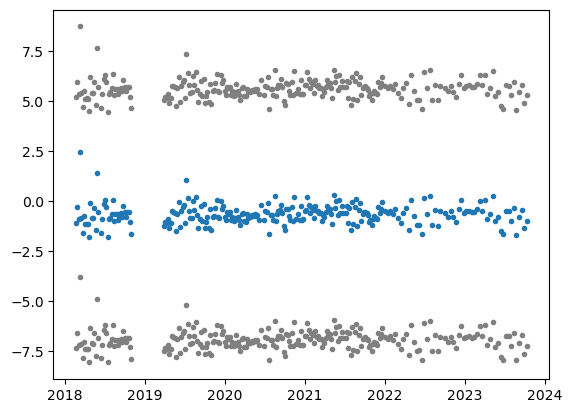

7


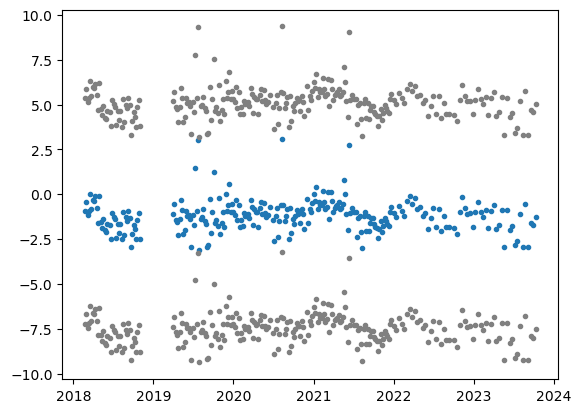

8


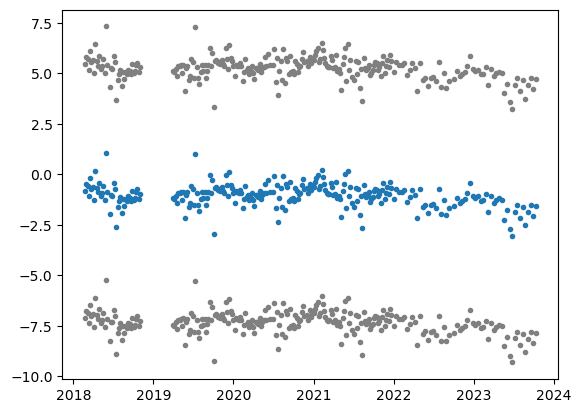

9


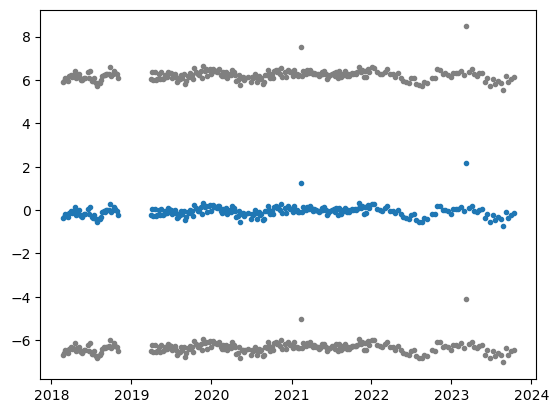

10


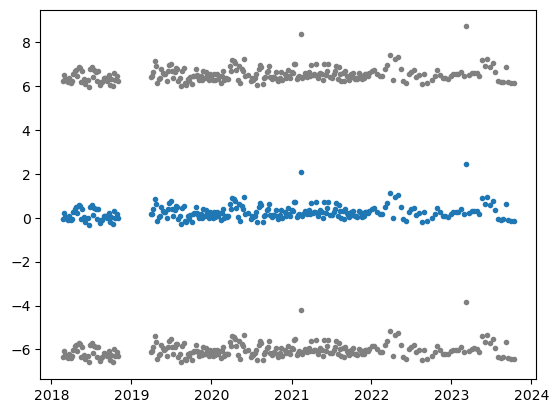

11


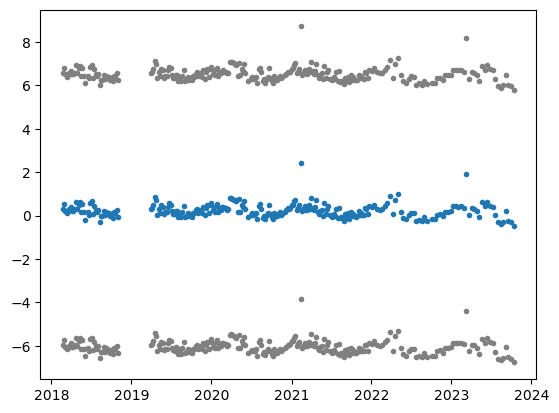

12


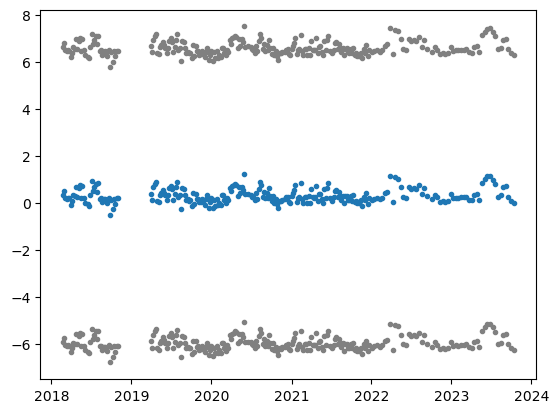

13


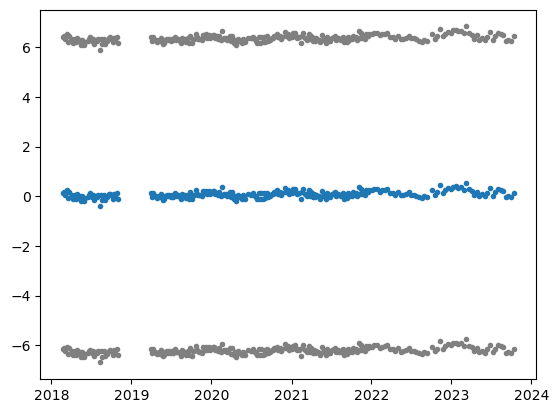

14


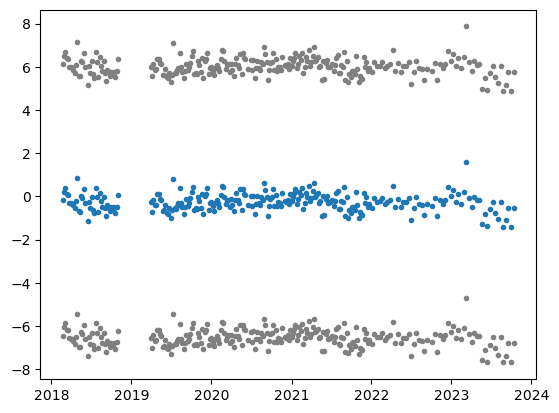

15


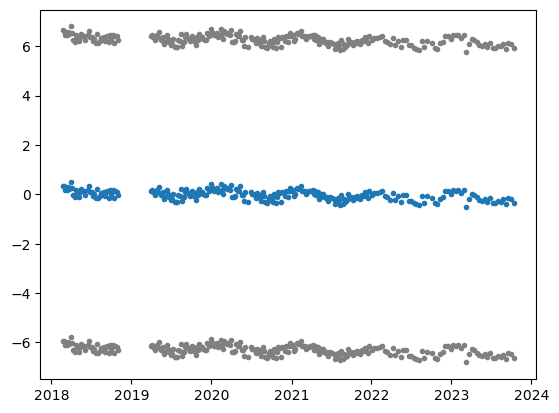

16


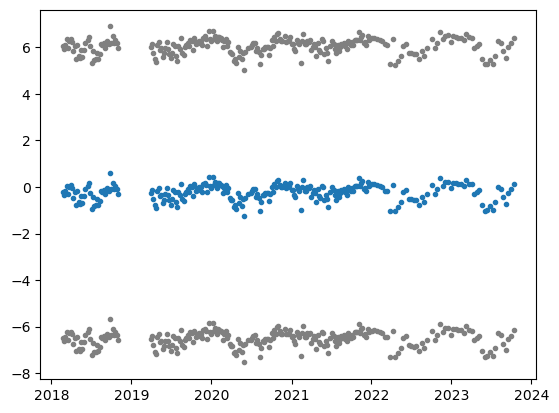

17


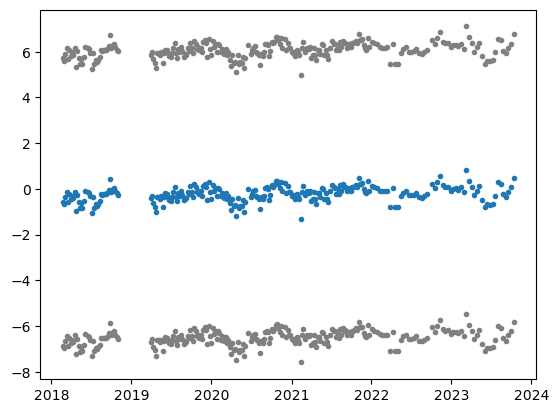

18


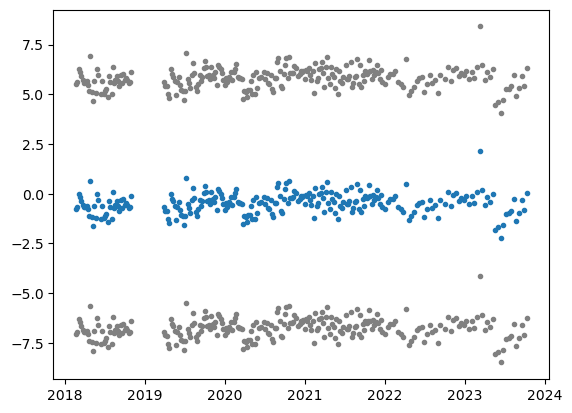

19


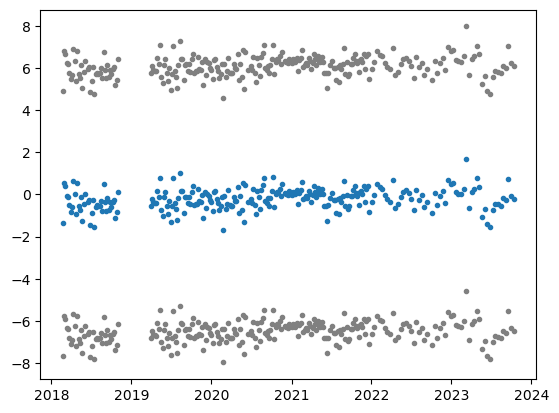

20


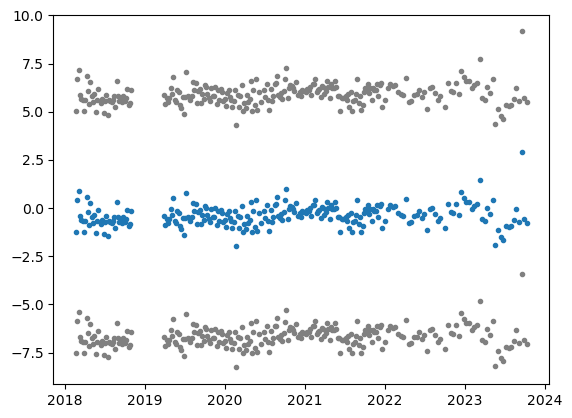

21


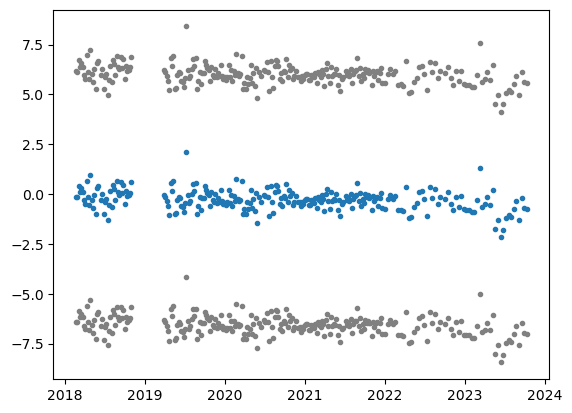

22


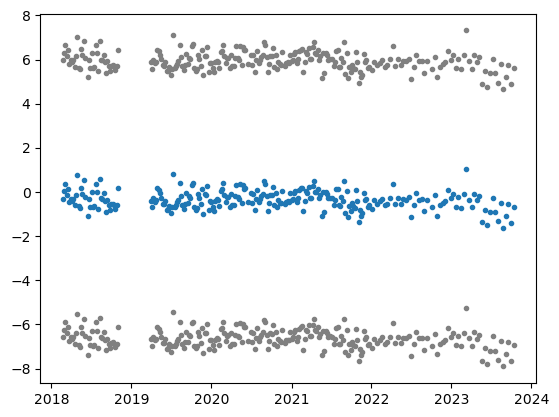

23


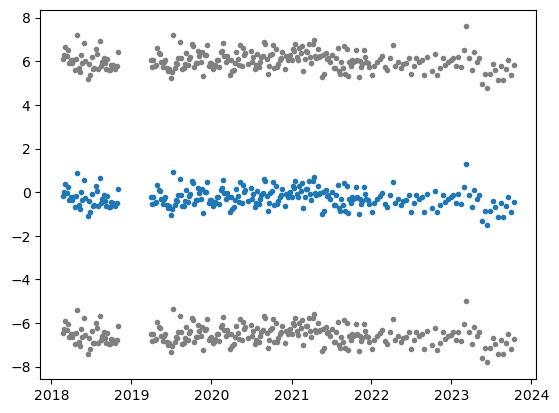

24


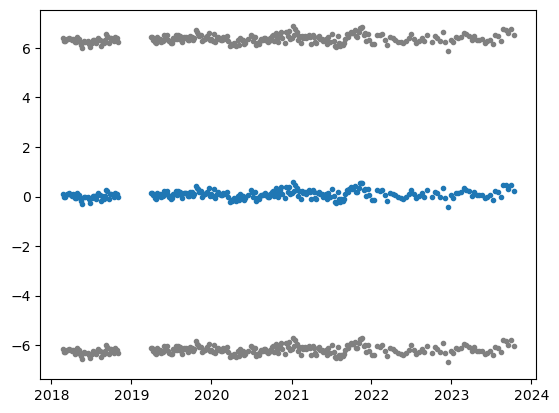

25


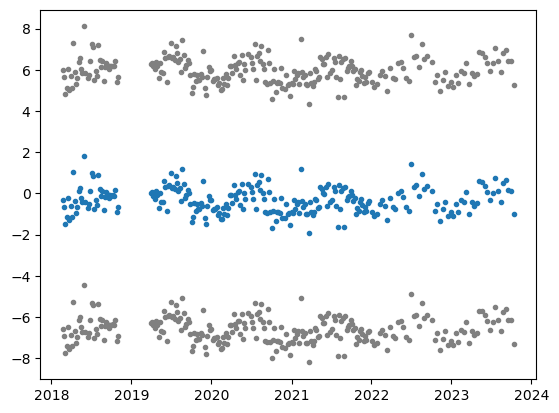

26


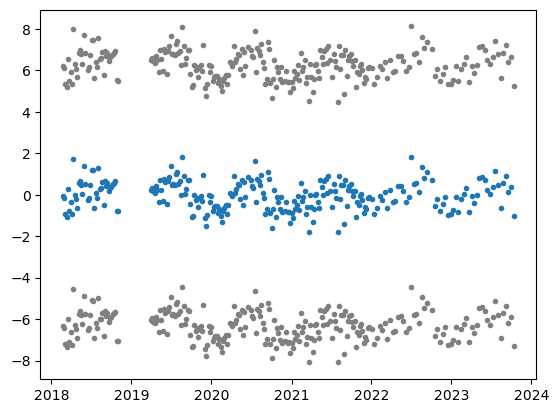

27


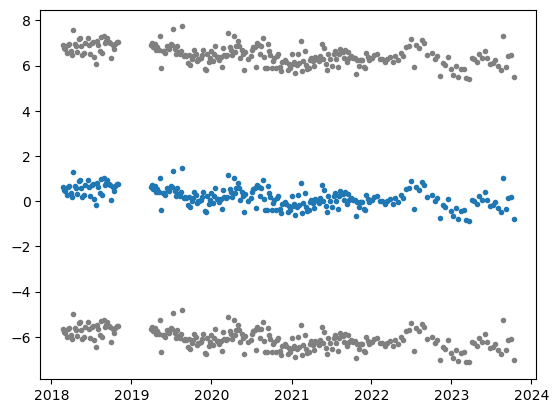

28


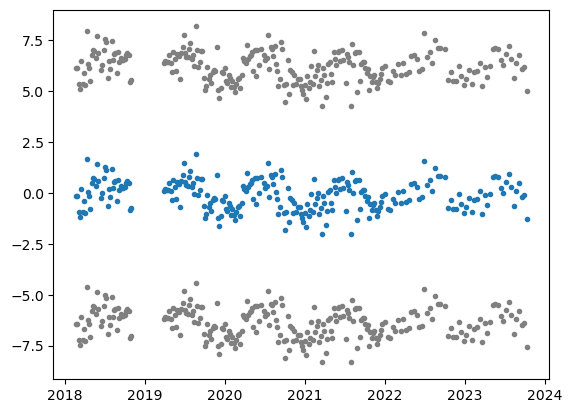

29


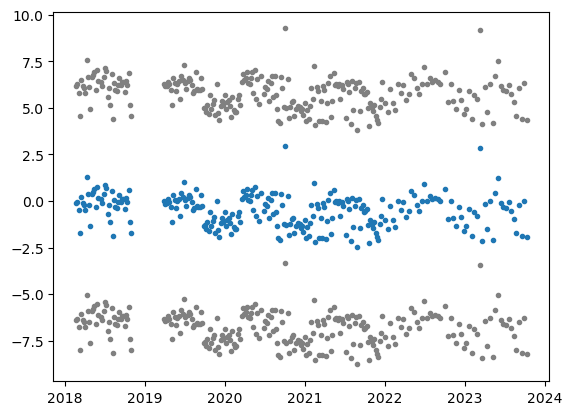

30


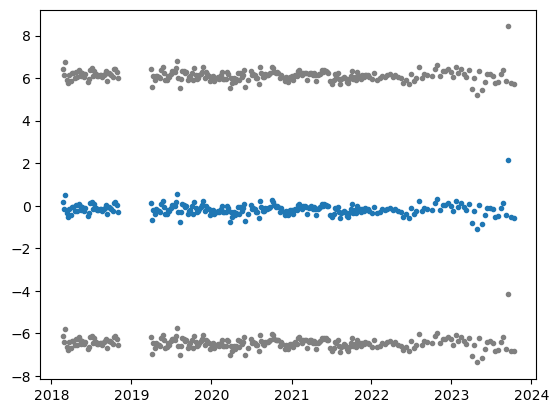

31


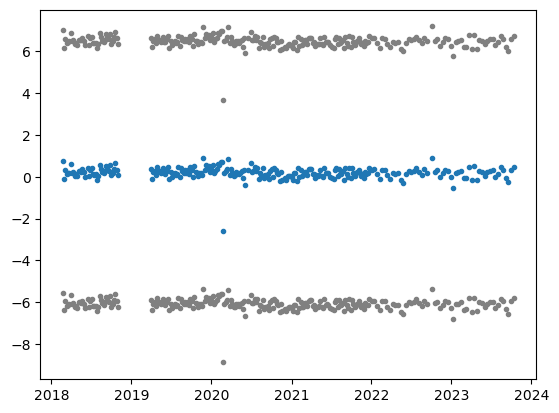

32


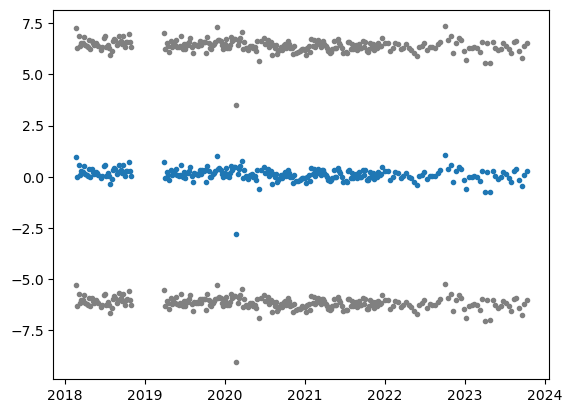

33


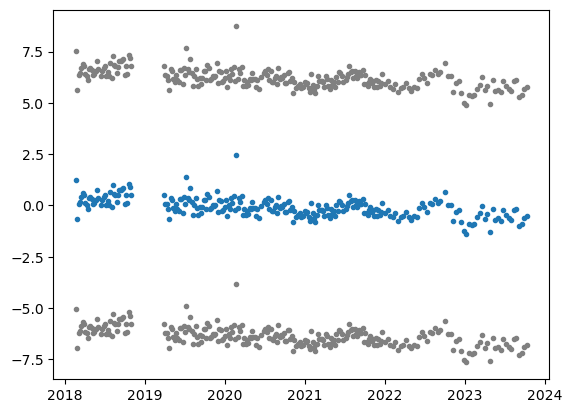

34


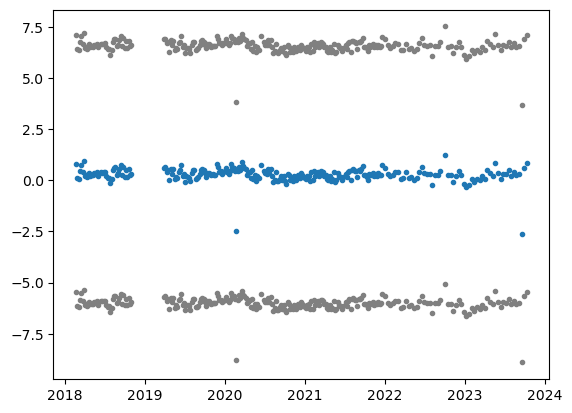

35


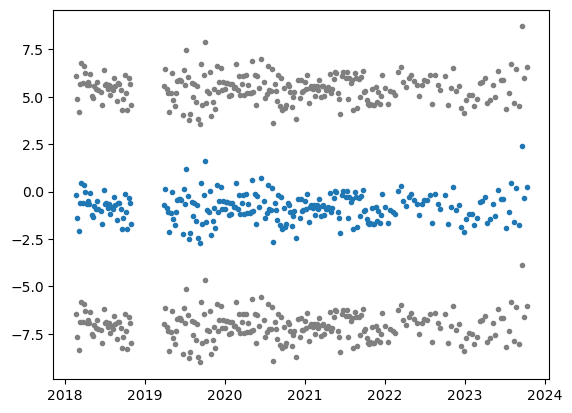

36


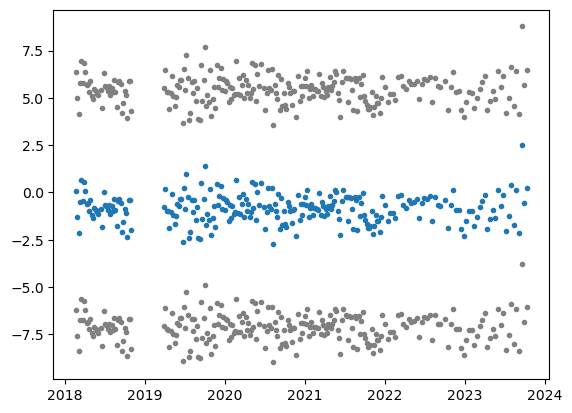

37


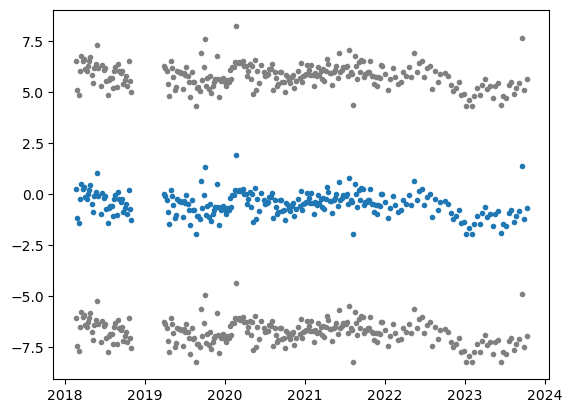

38


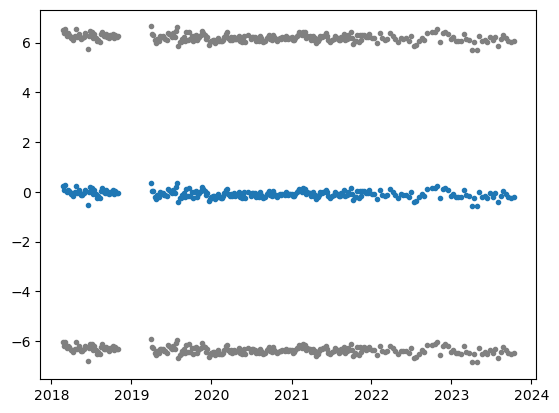

39


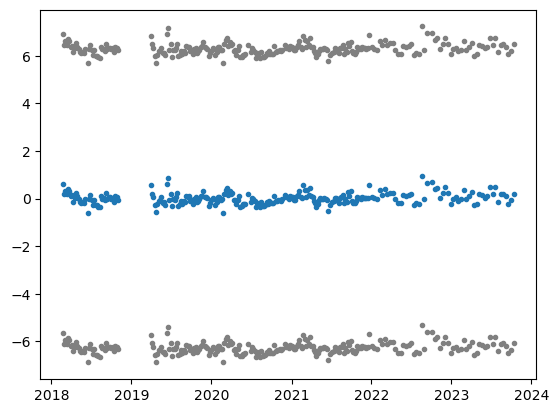

40


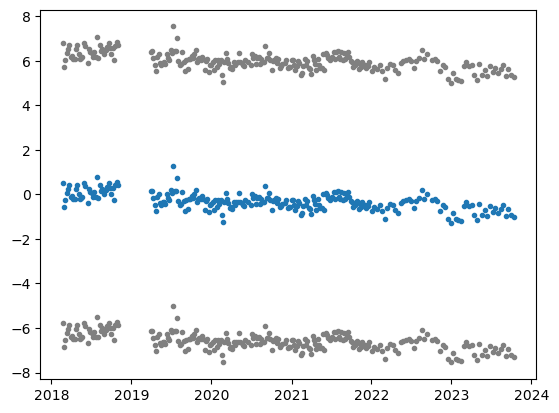

41


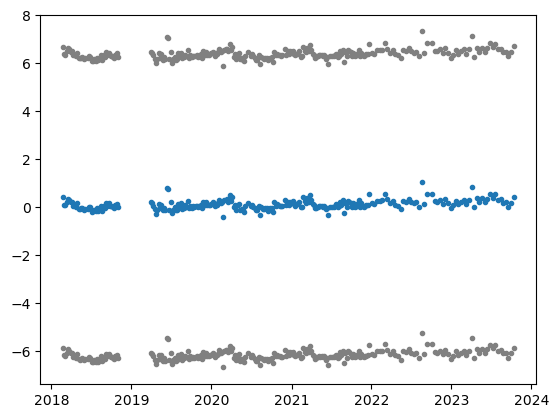

42


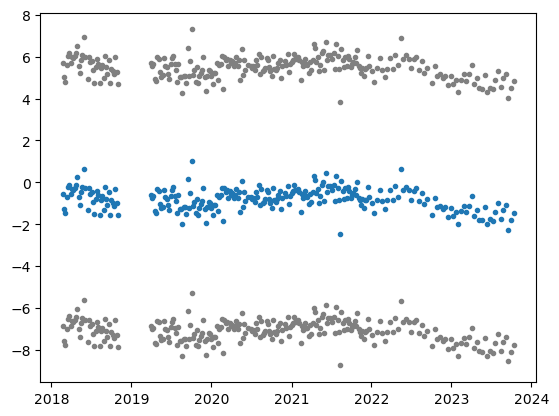

43


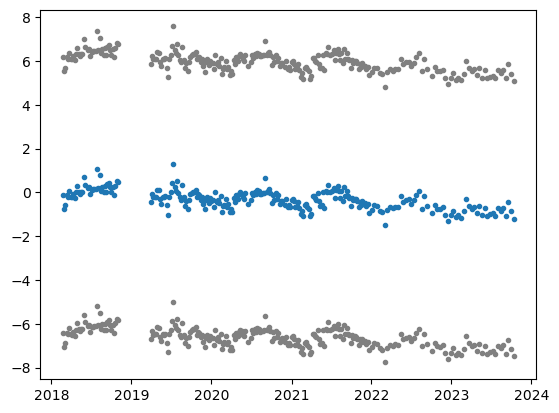

44


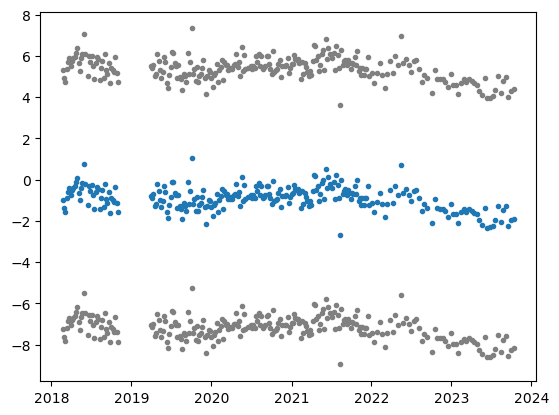

45


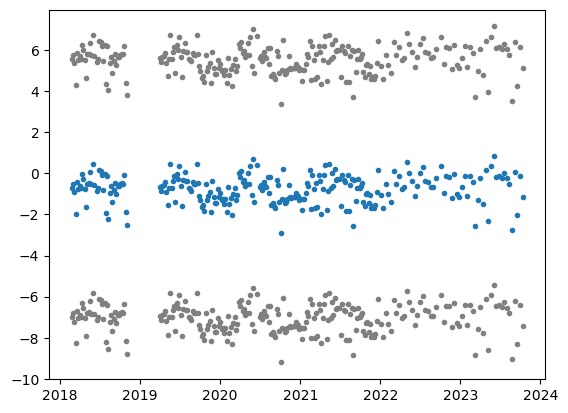

46


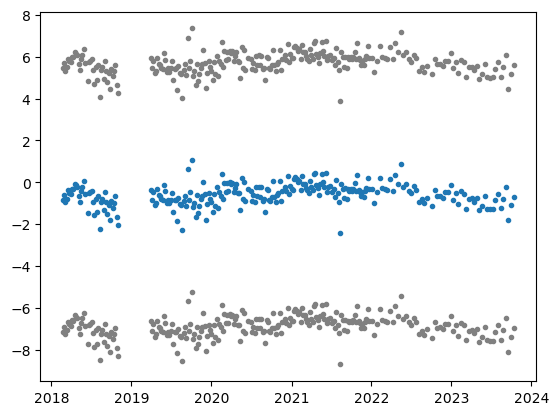

47


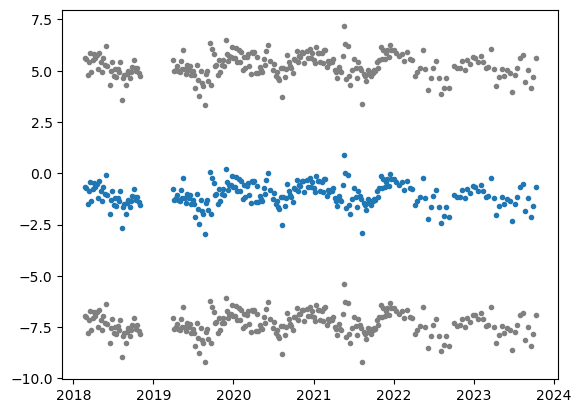

48


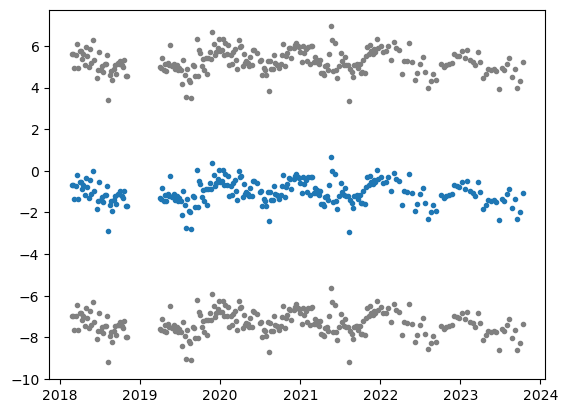

49


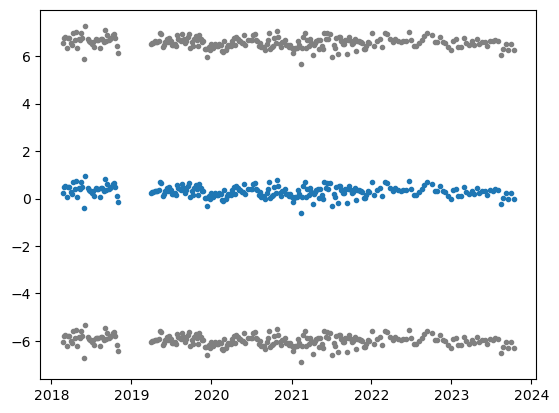

50


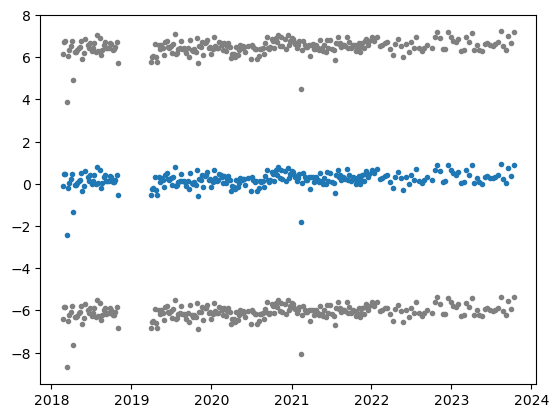

51


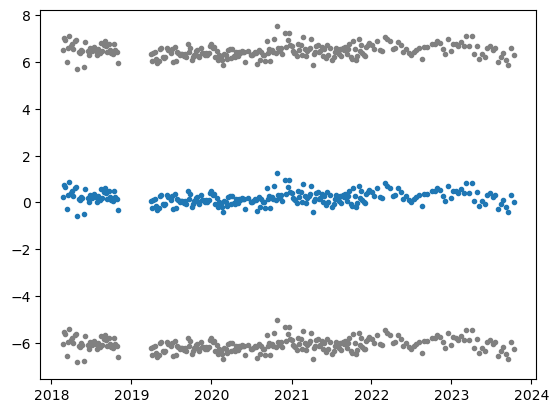

52


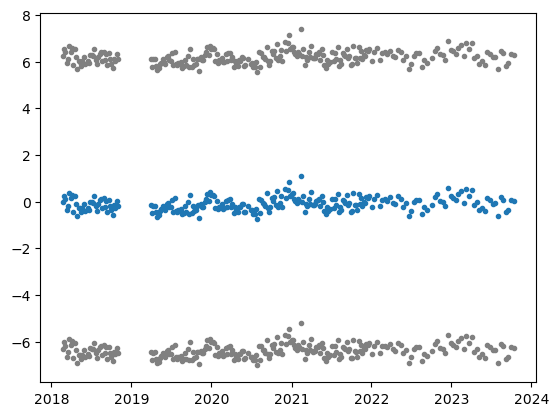

53


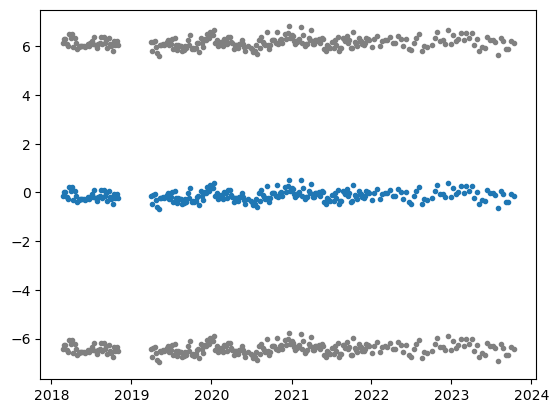

54


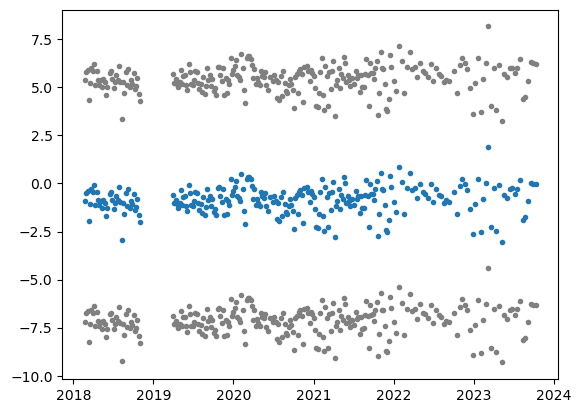

55


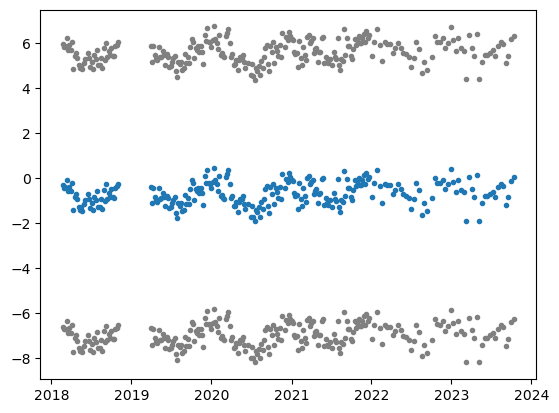

56


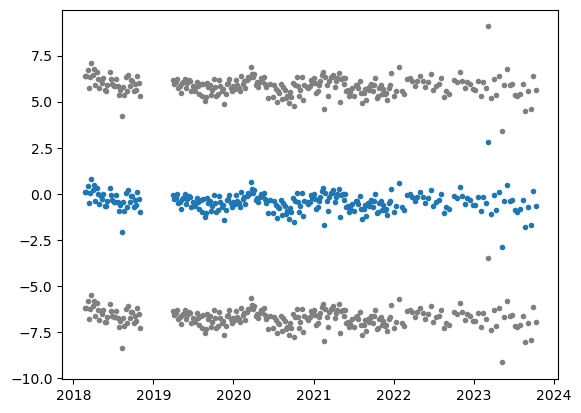

57


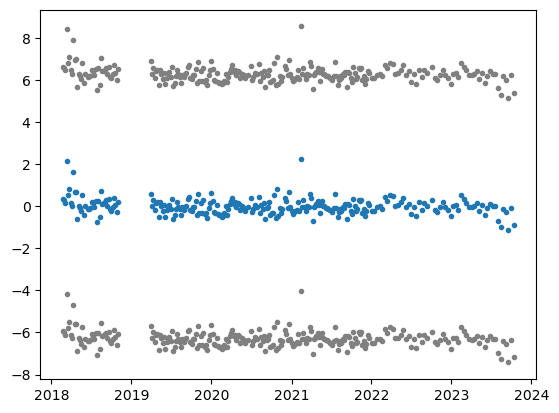

58


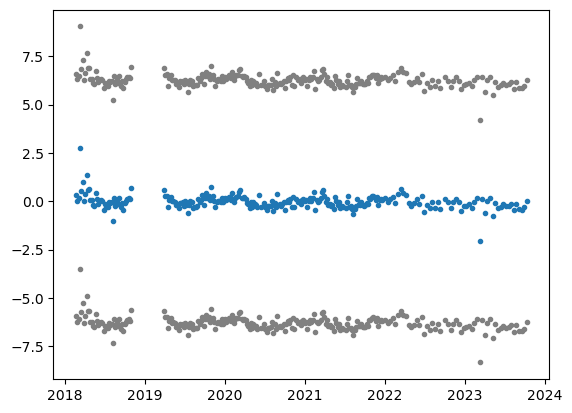

59


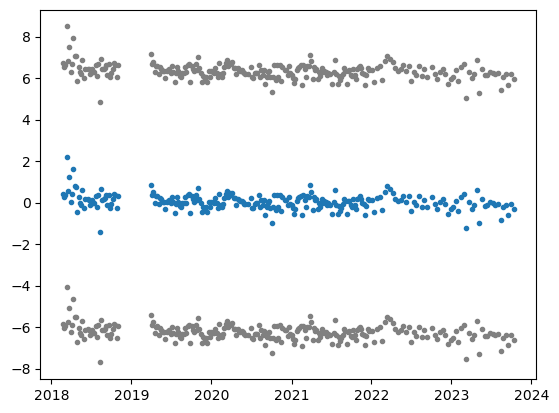

60


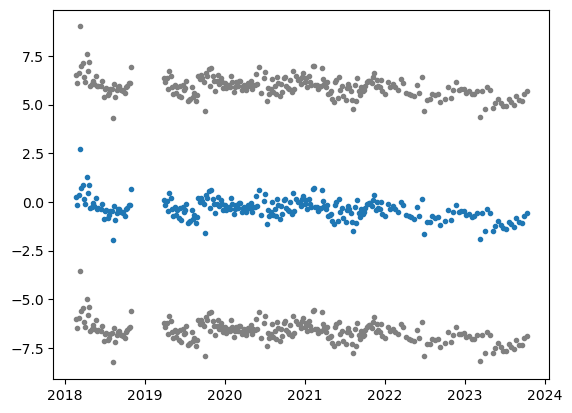

61


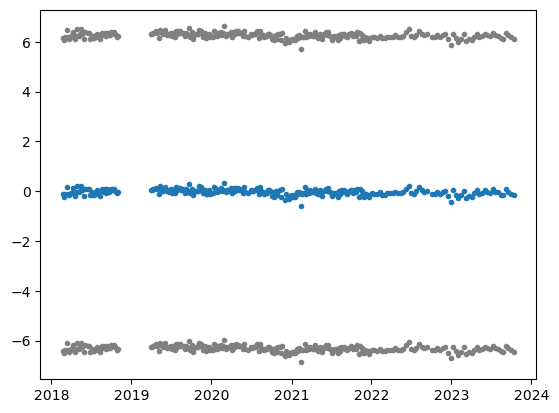

62


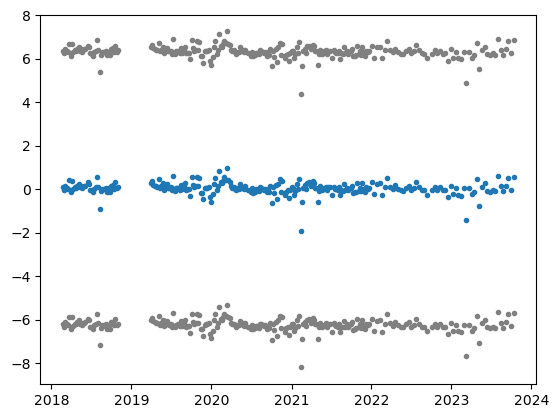

63


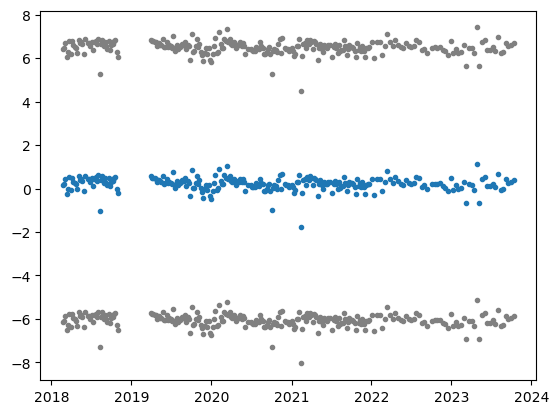

64


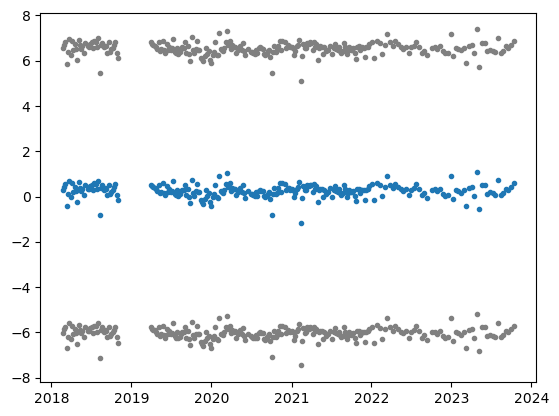

65


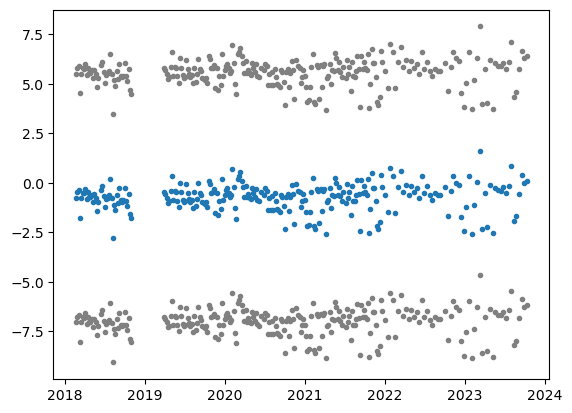

66


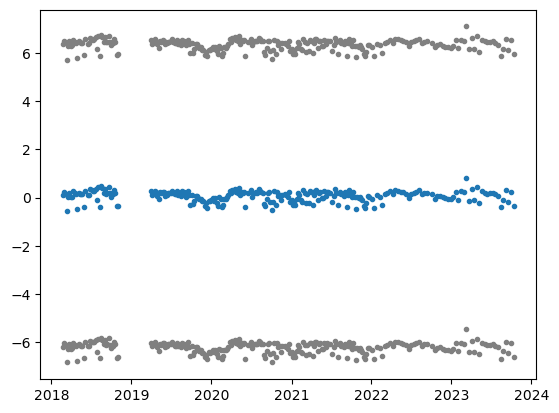

67


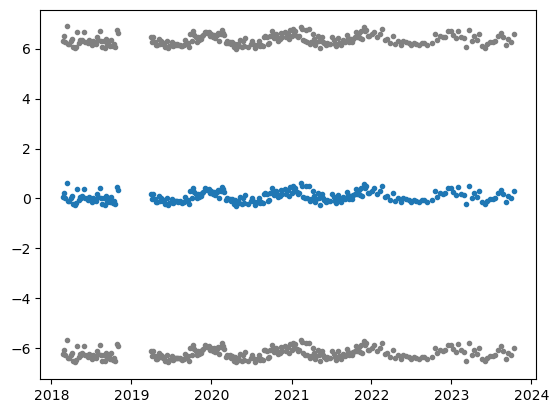

68


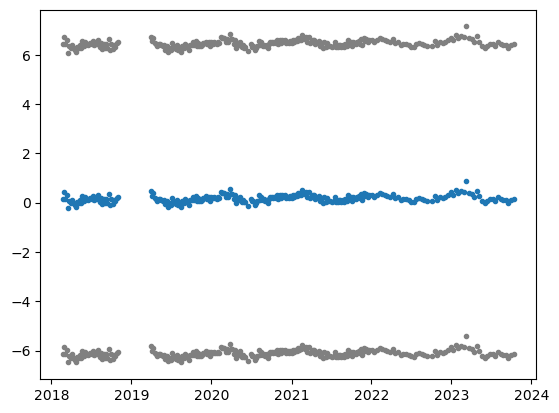

69


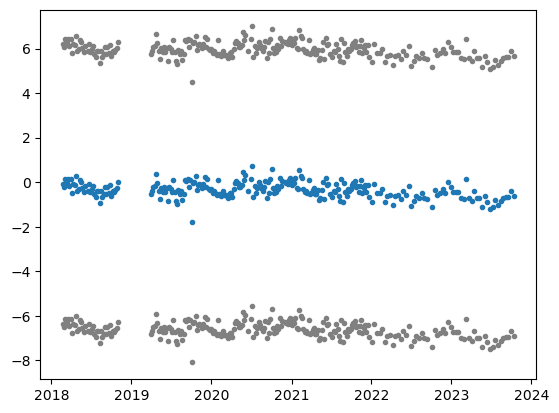

70


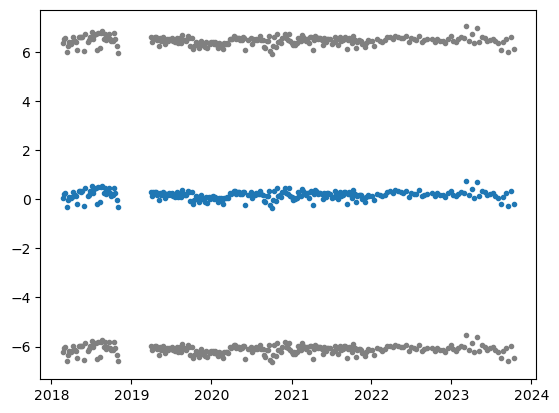

71


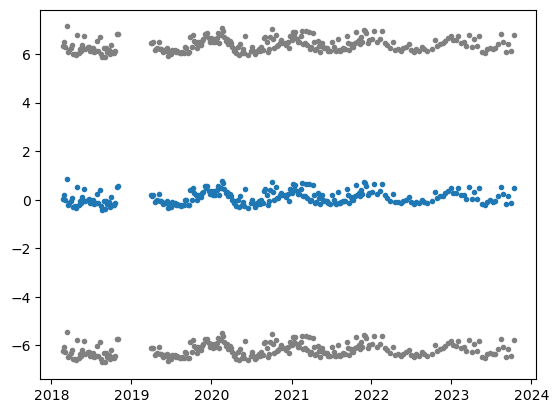

72


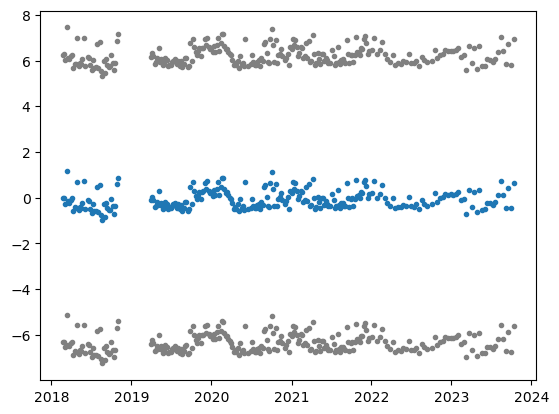

73


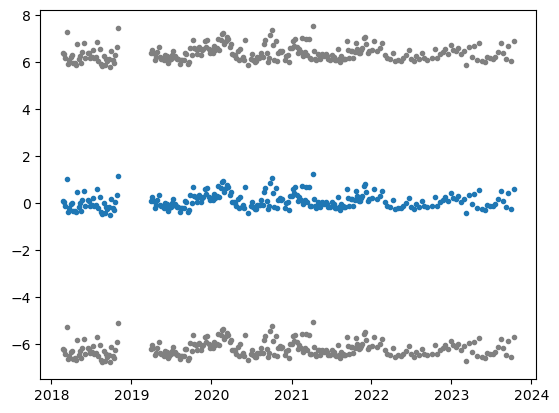

74


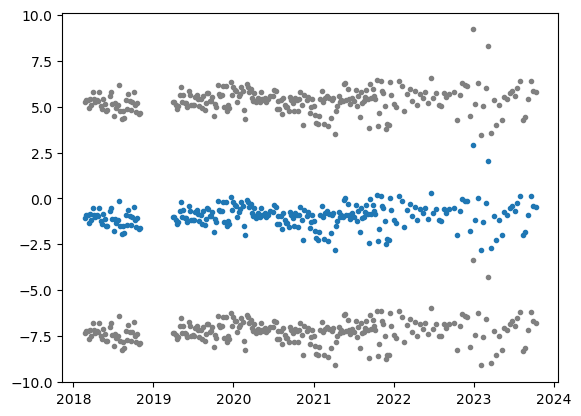

75


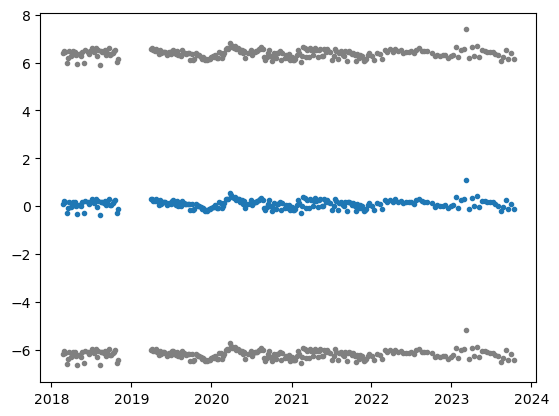

76


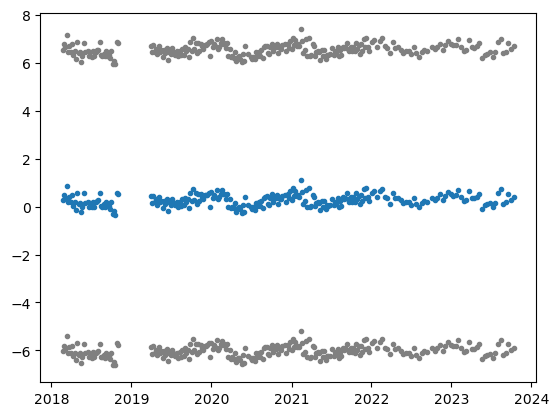

77


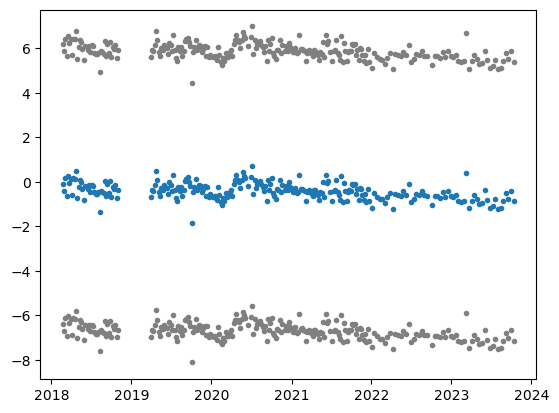

78


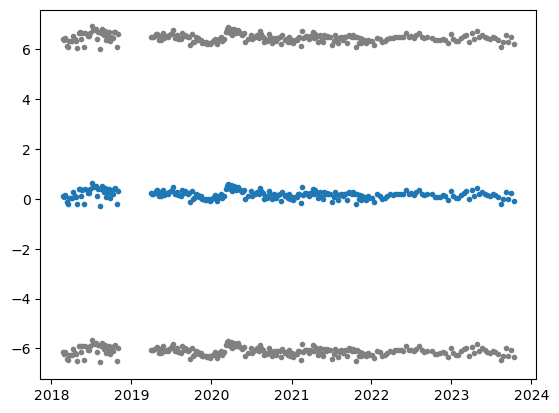

79


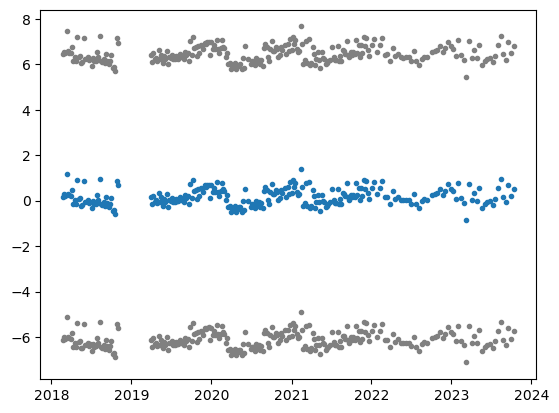

80


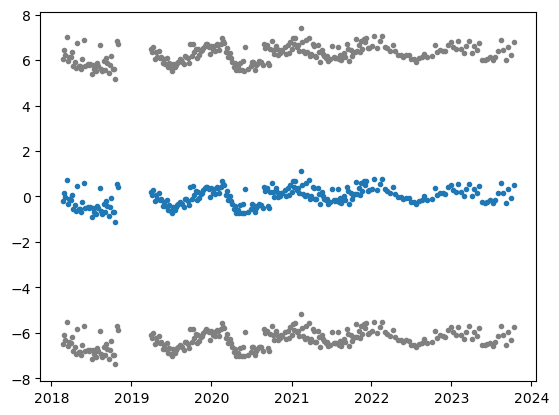

81


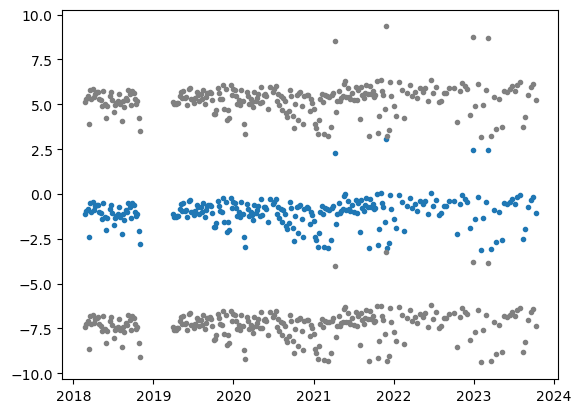

82


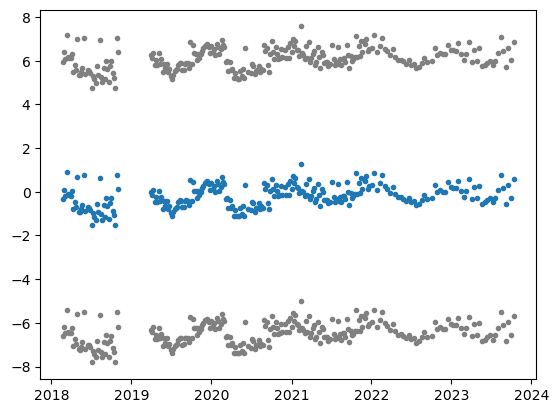

83


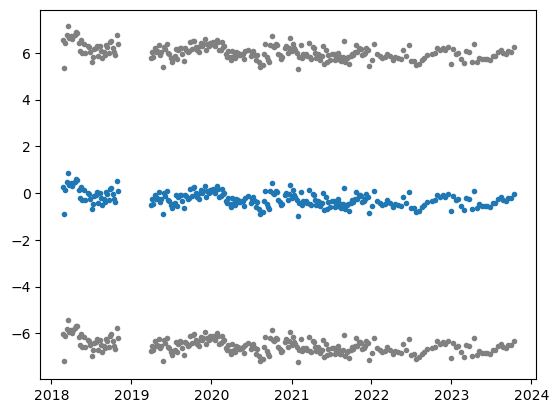

84


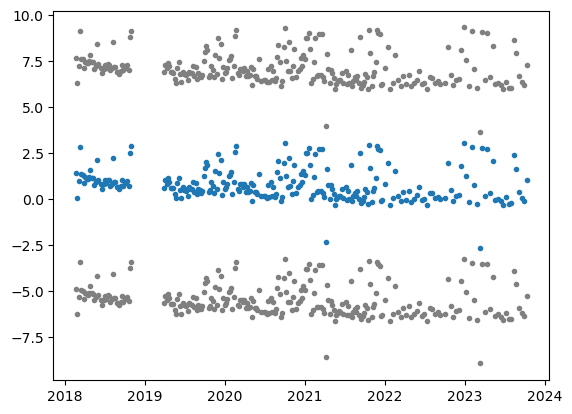

85


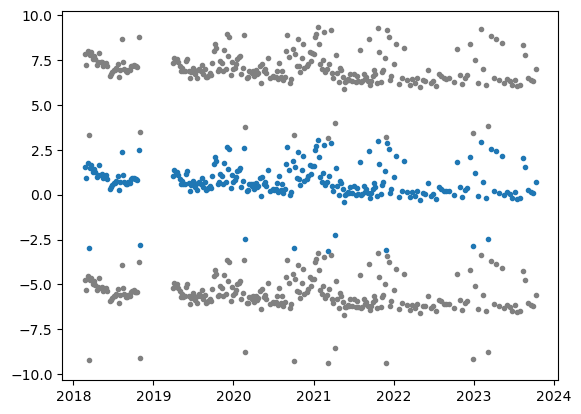

86


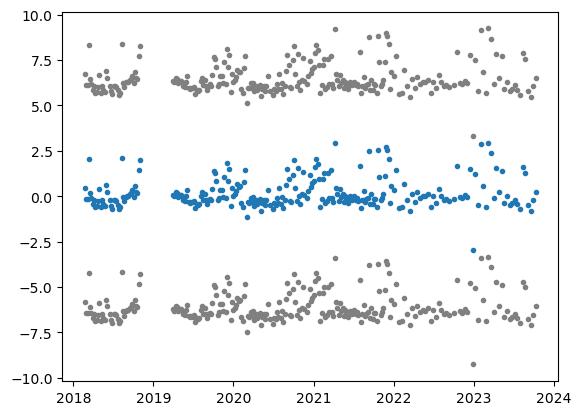

87


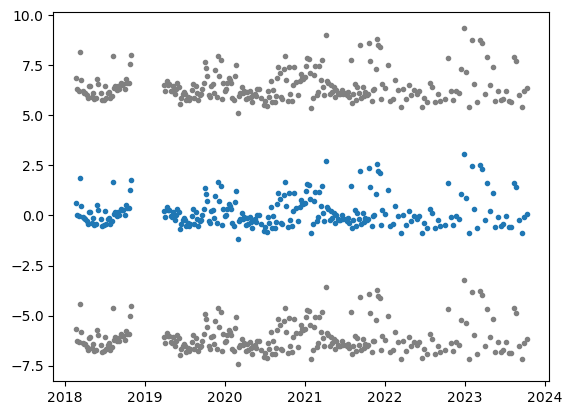

88


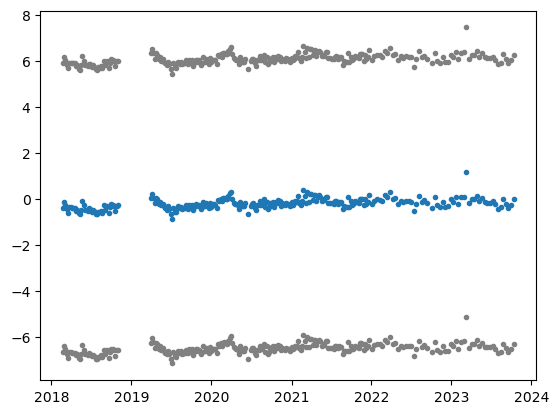

89


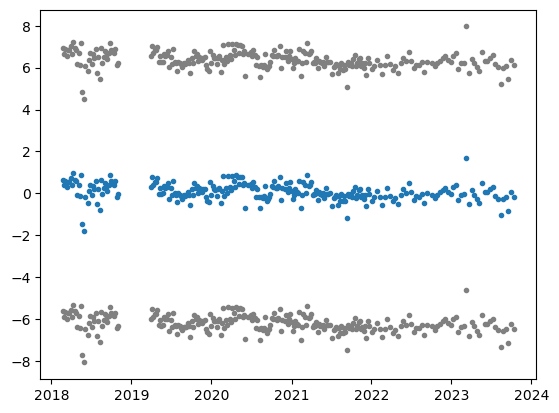

90


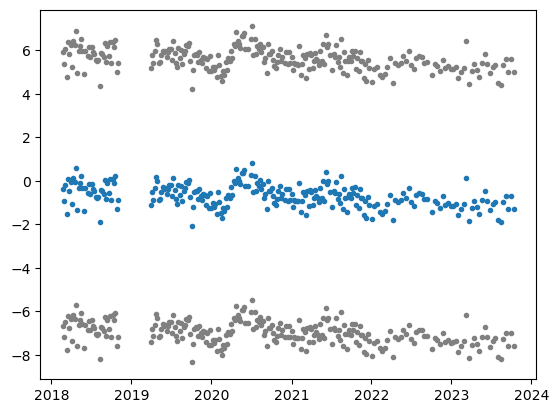

91


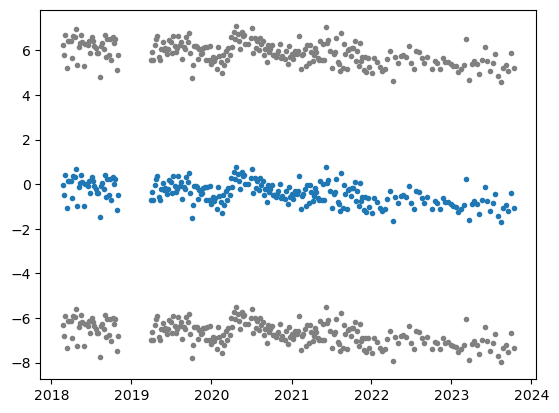

92


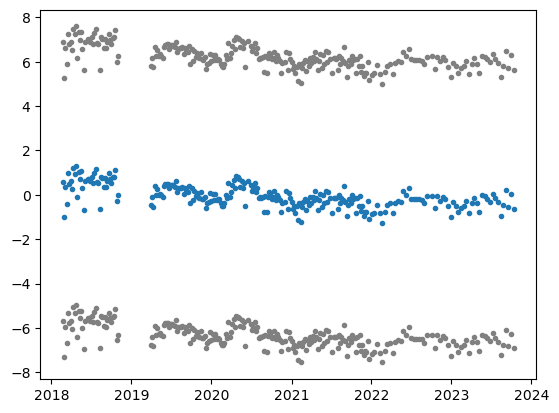

93


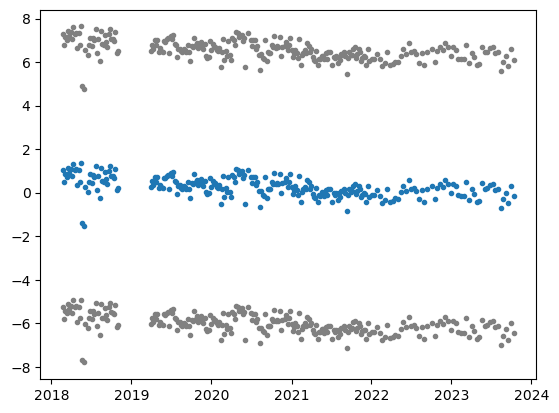

94


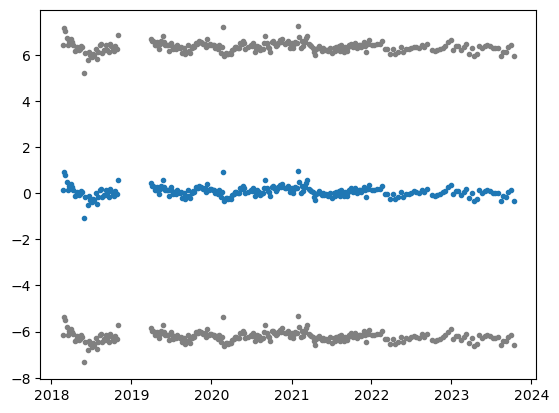

95


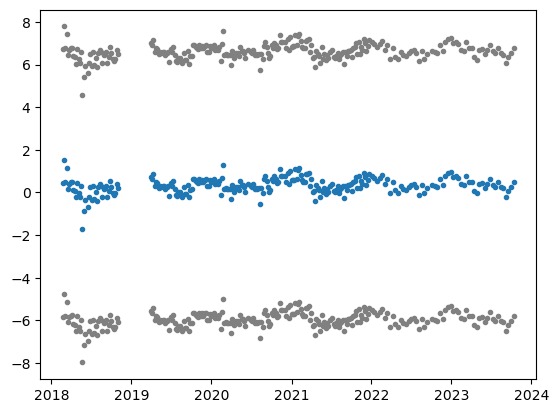

96


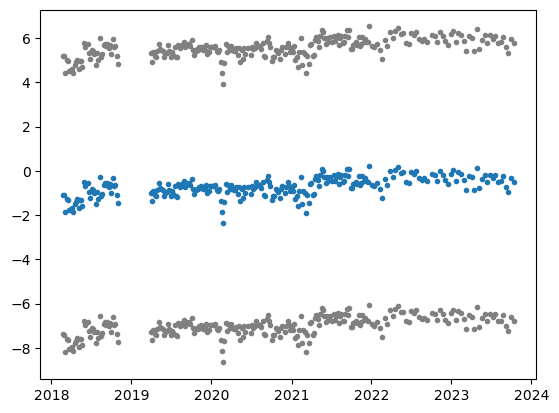

97


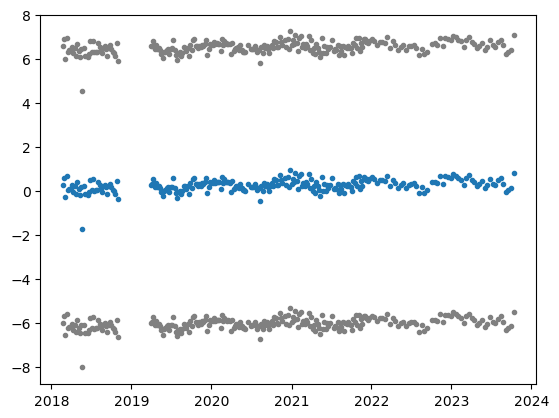

98


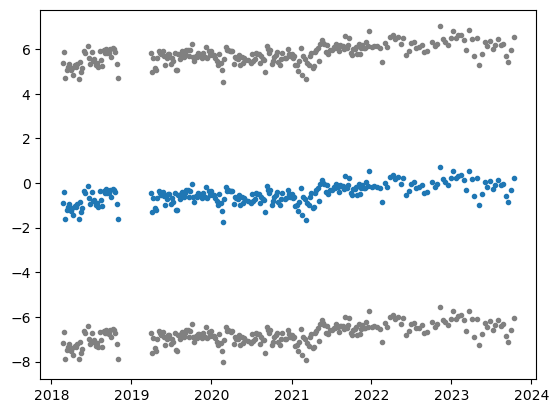

99


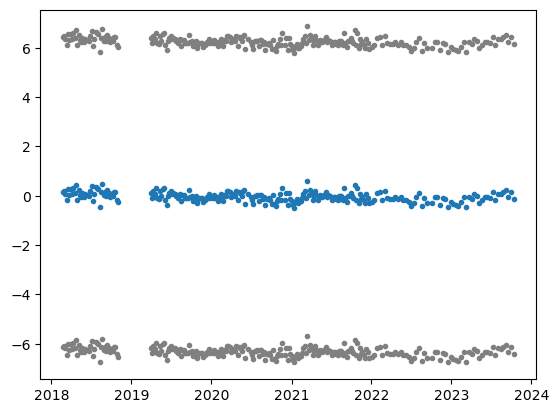

100


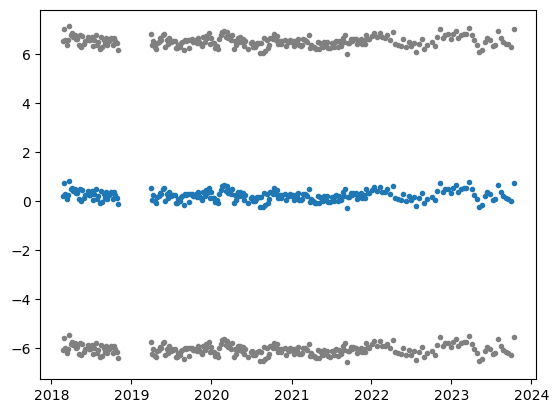

101


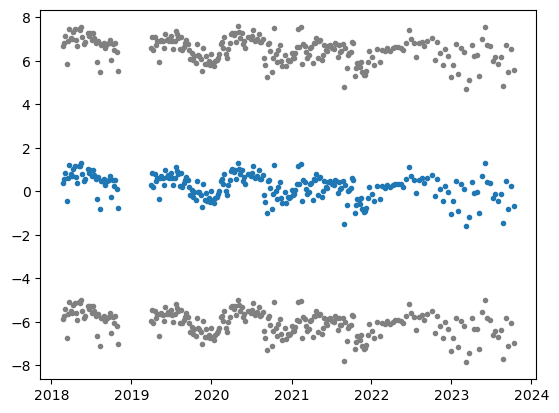

102


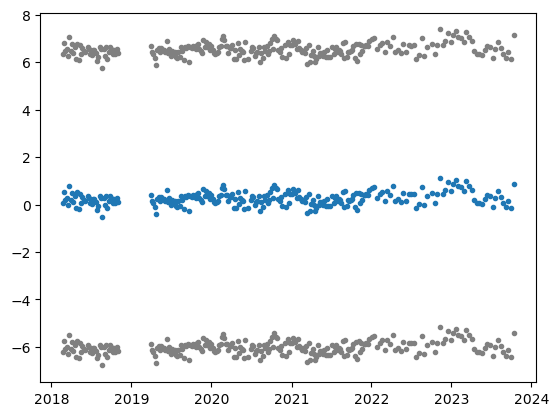

103


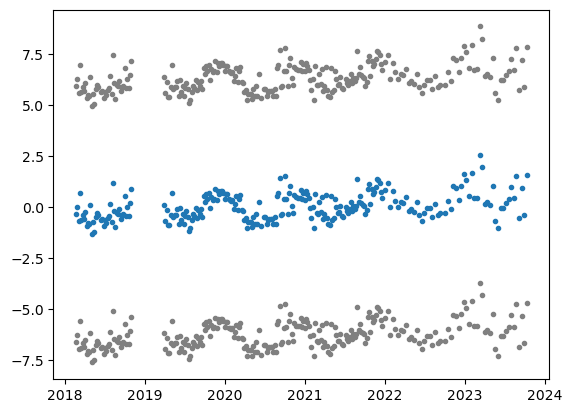

104


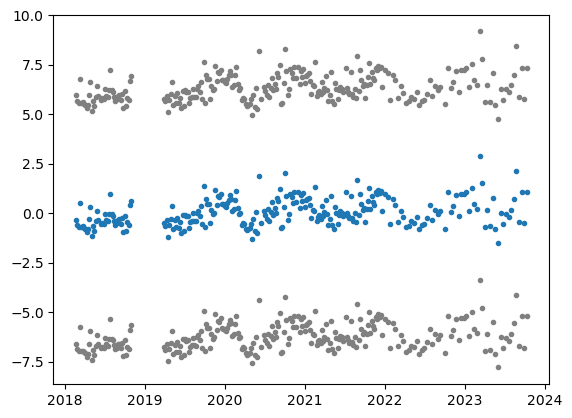

105


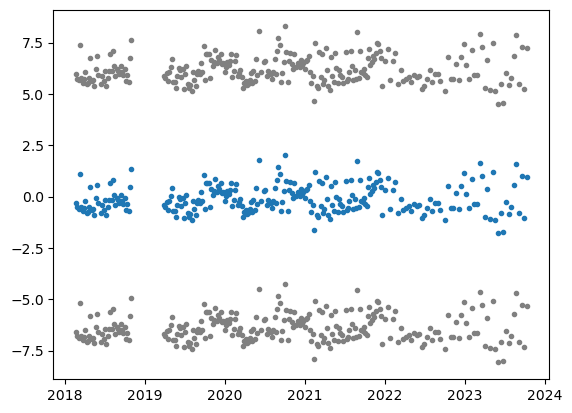

106


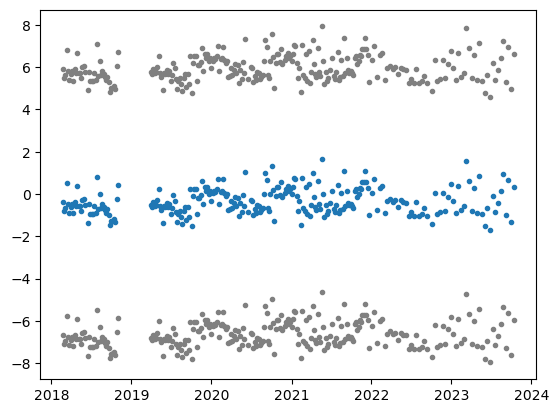

107


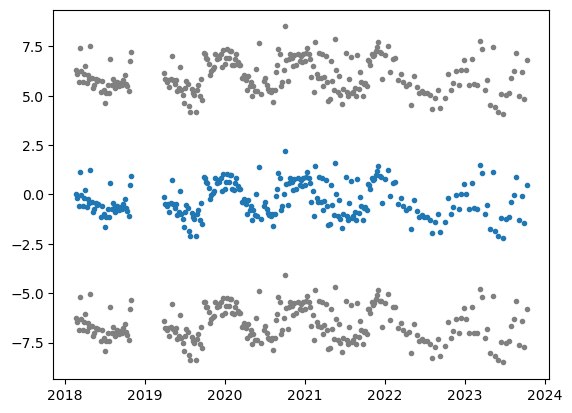

108


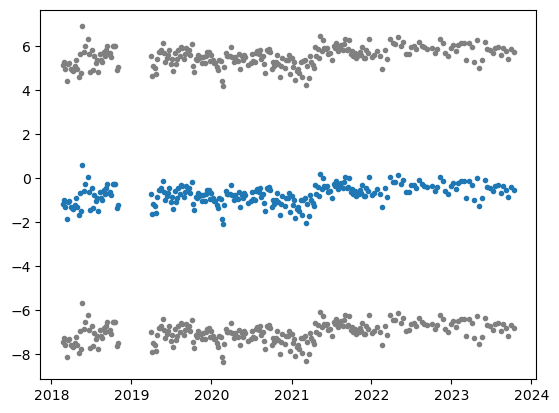

109


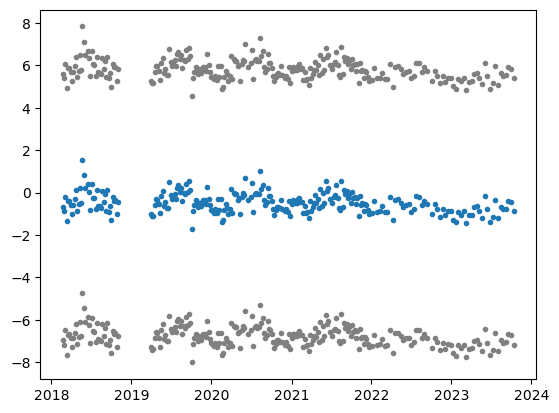

110


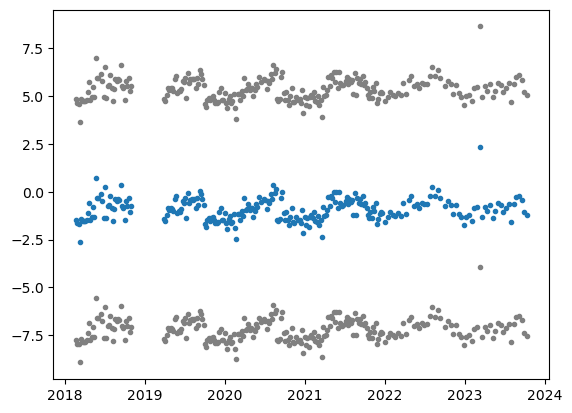

111


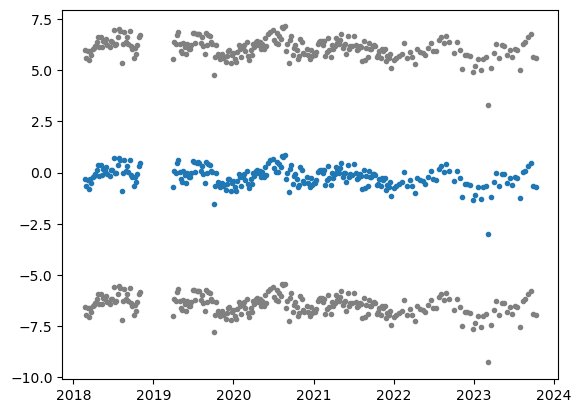

112


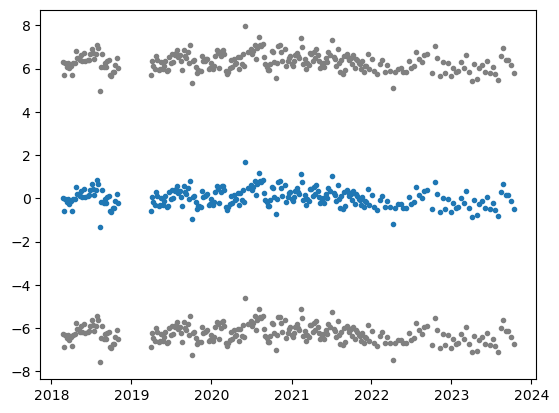

113


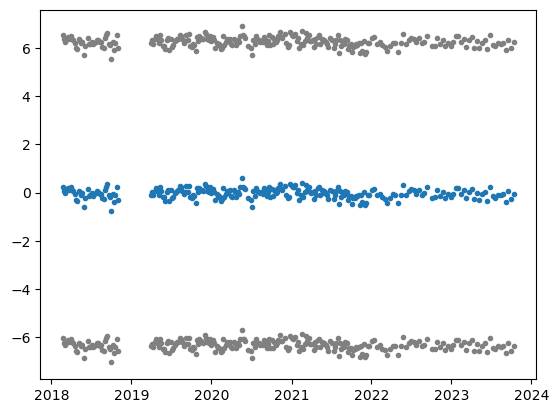

114


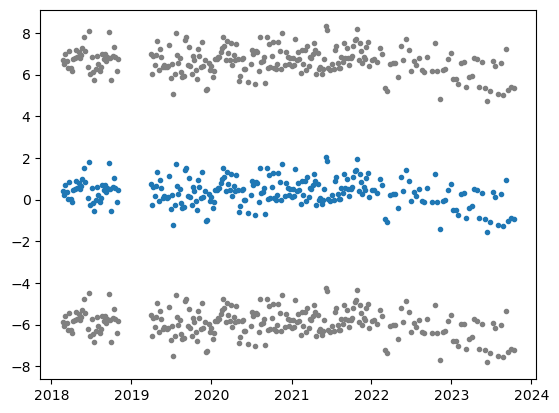

115


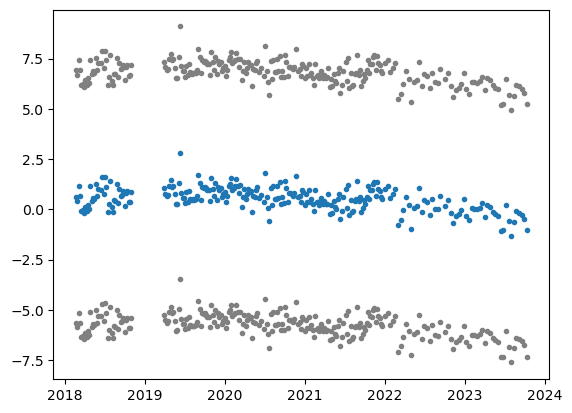

116


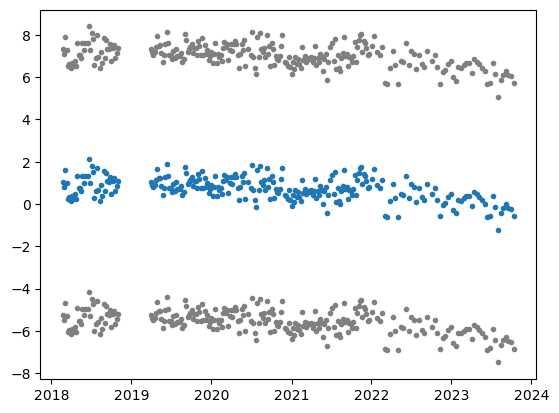

117


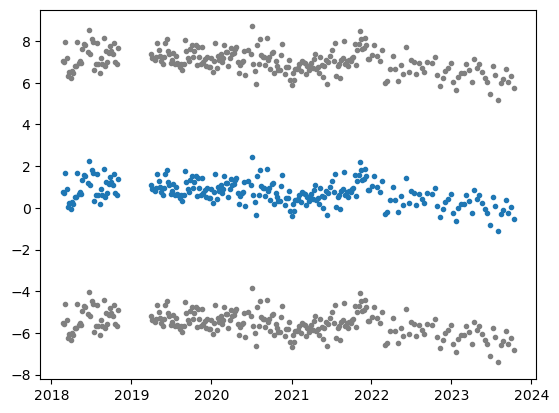

118


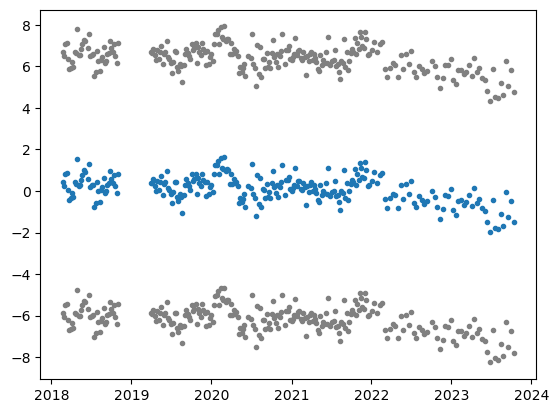

119


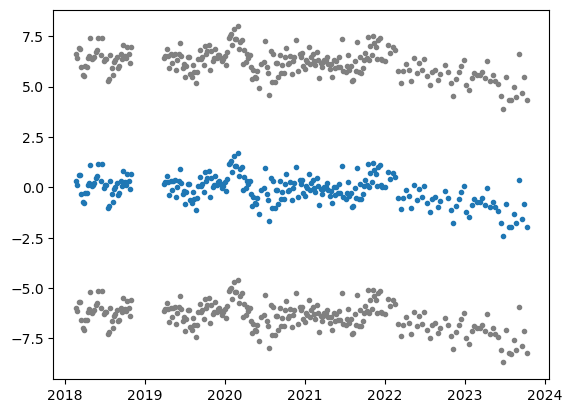

120


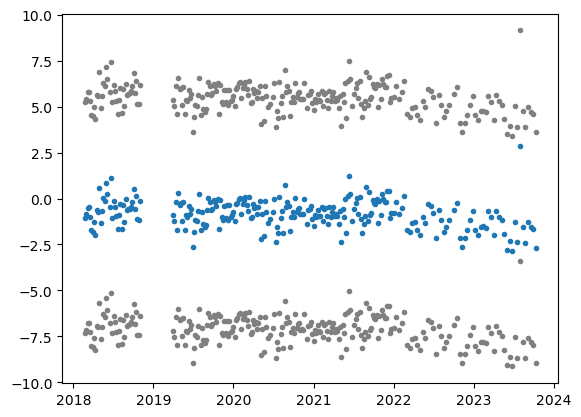

121


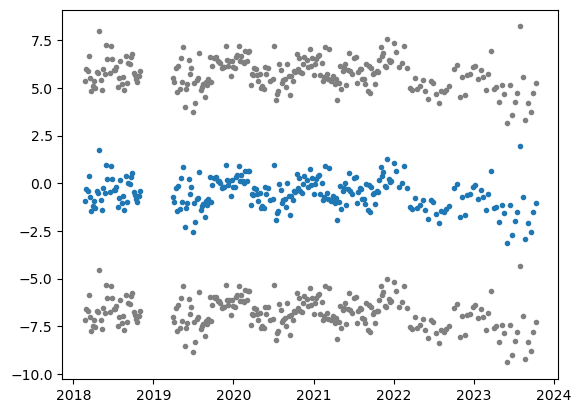

122


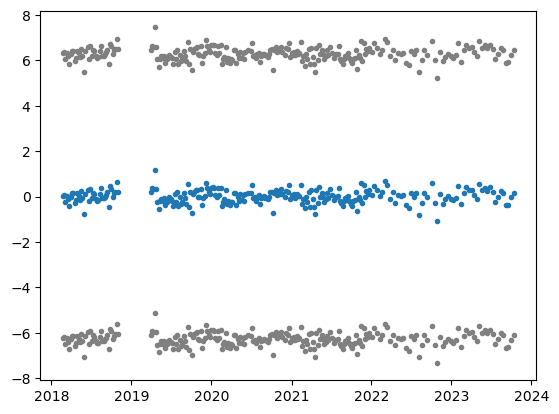

123


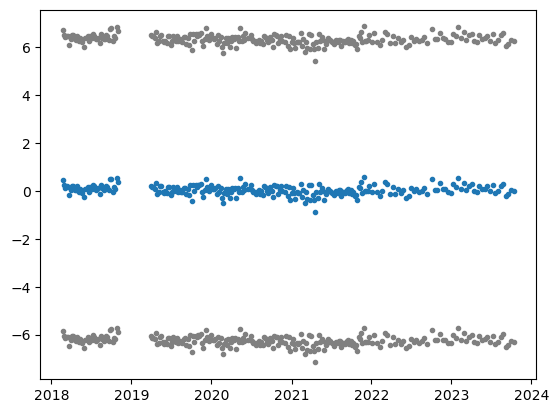

124


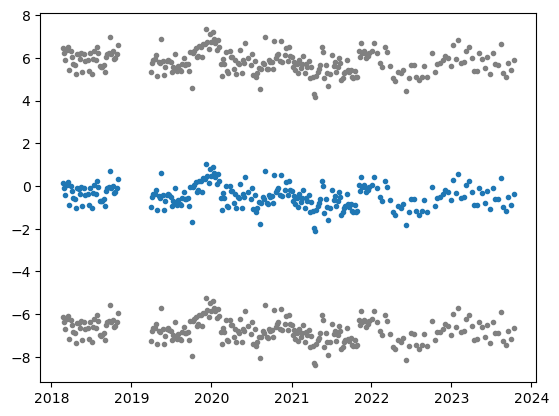

125


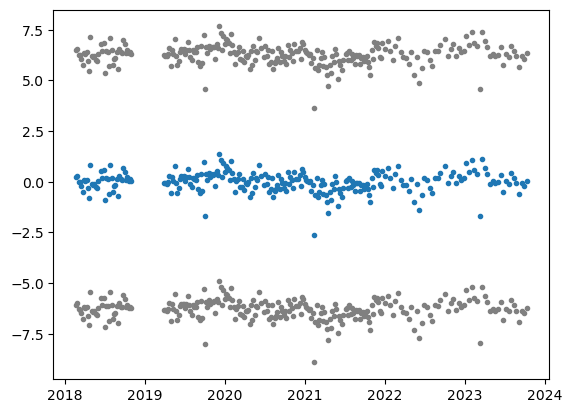

126


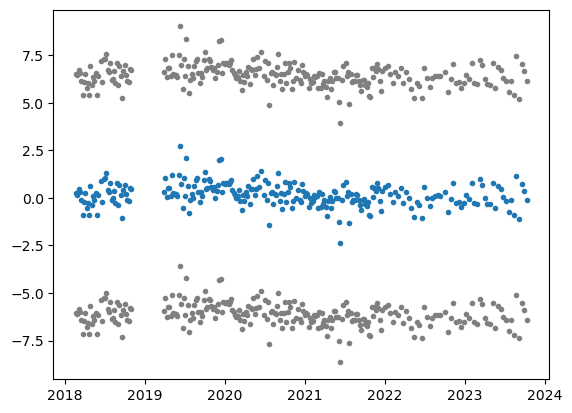

127


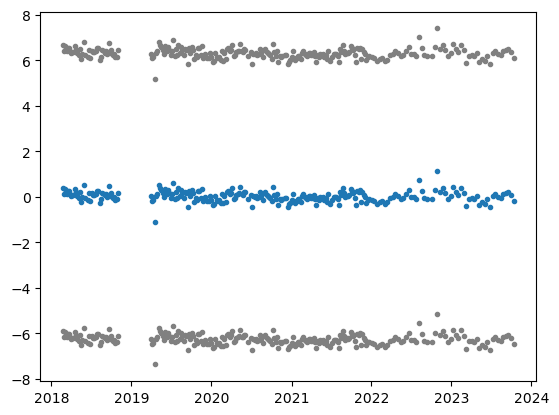

128


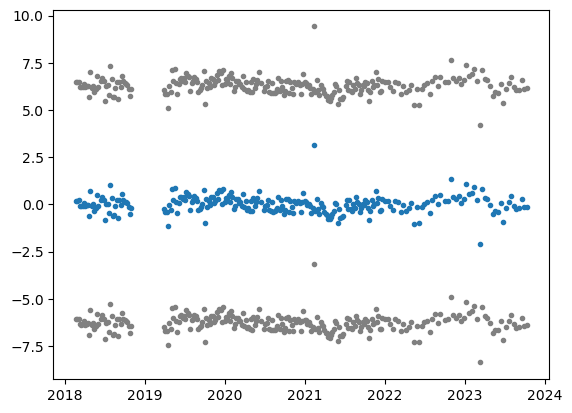

129


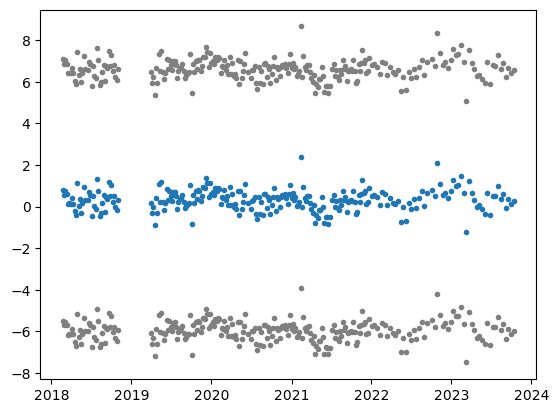

130


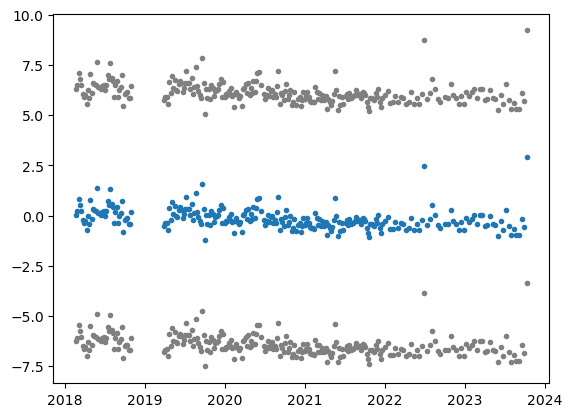

131


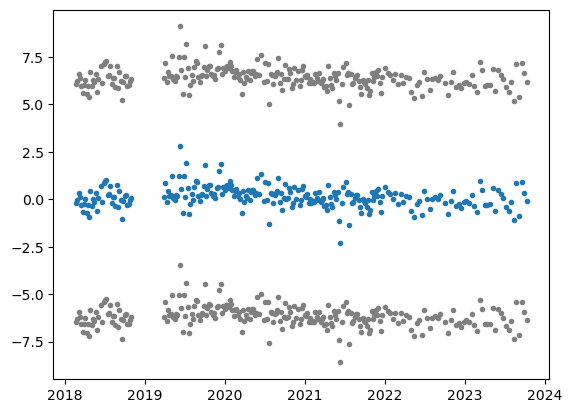

132


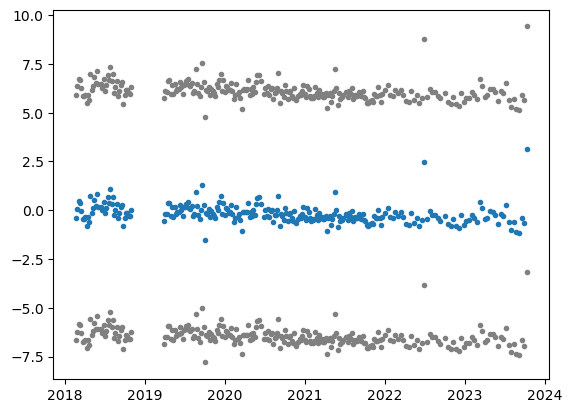

133


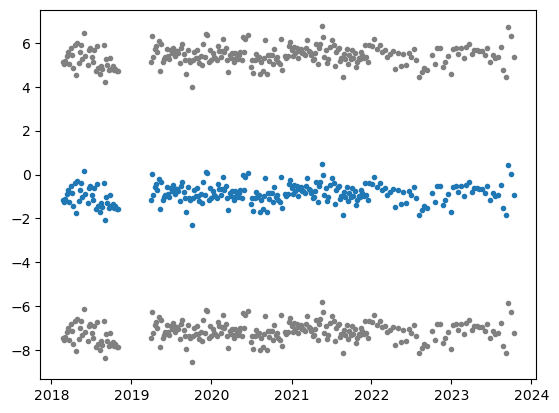

134


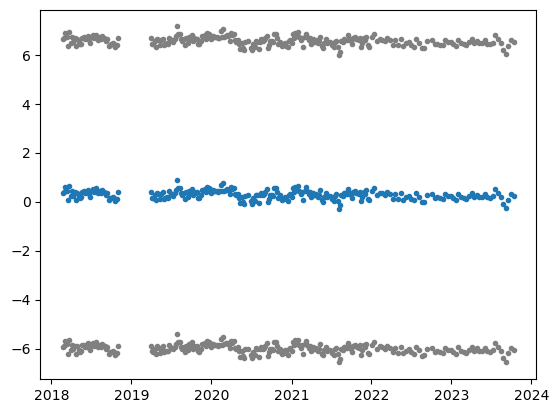

135


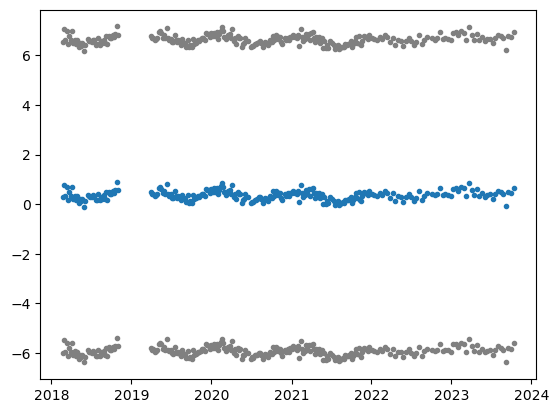

136


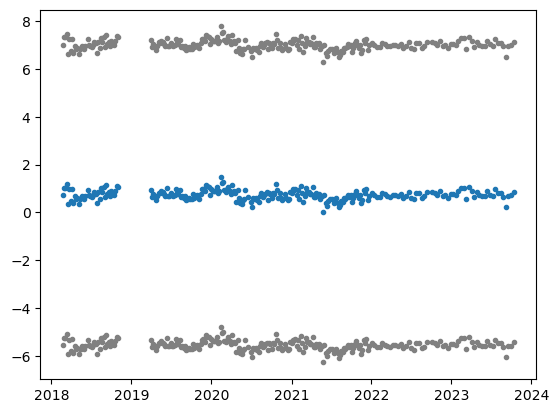

137


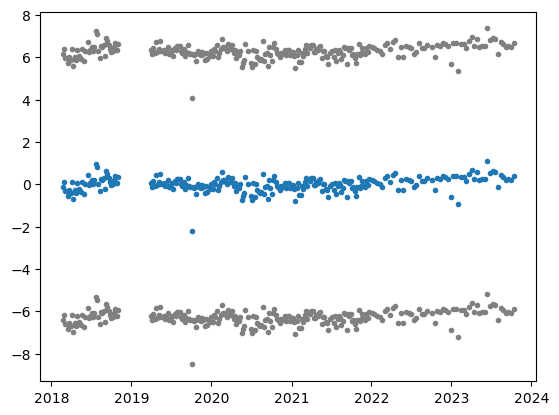

138


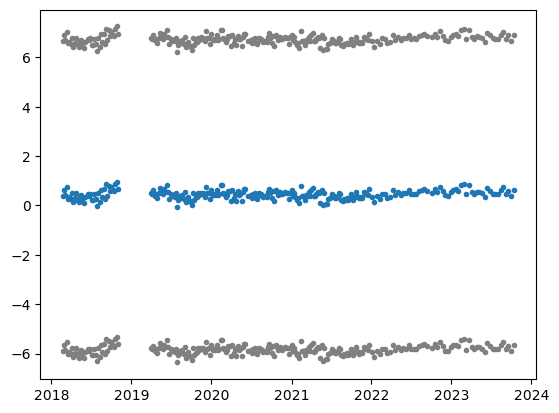

139


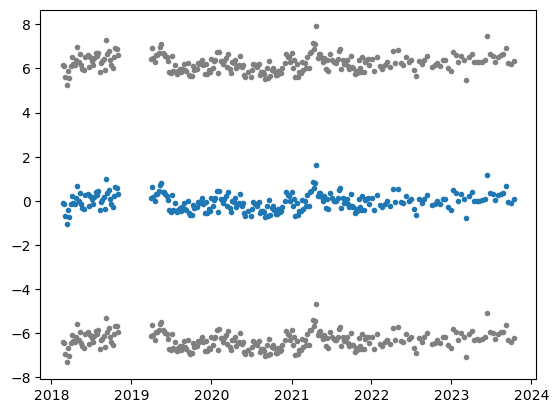

140


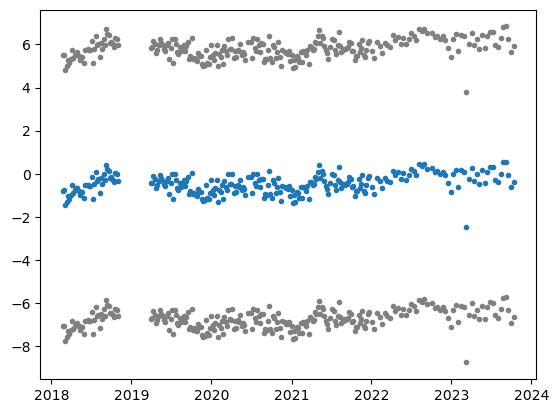

141


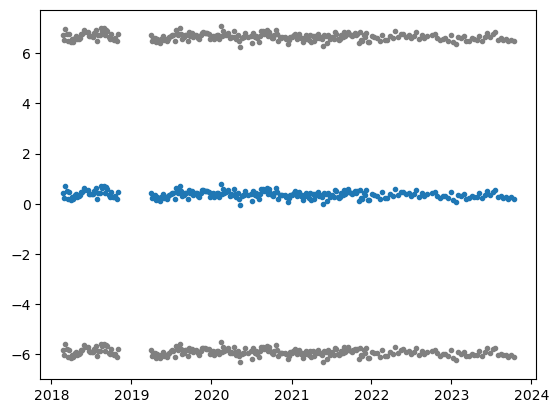

142


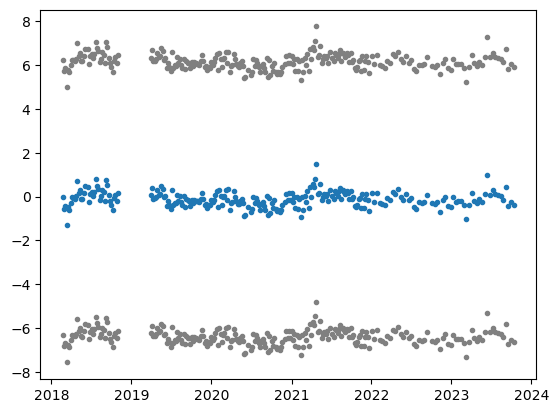

143


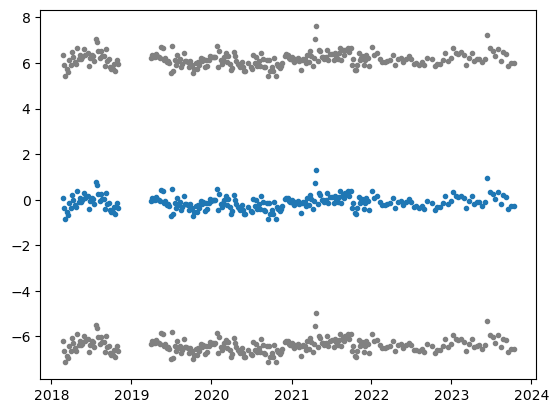

144


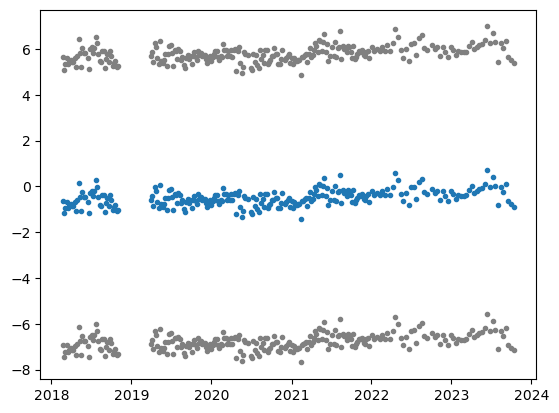

145


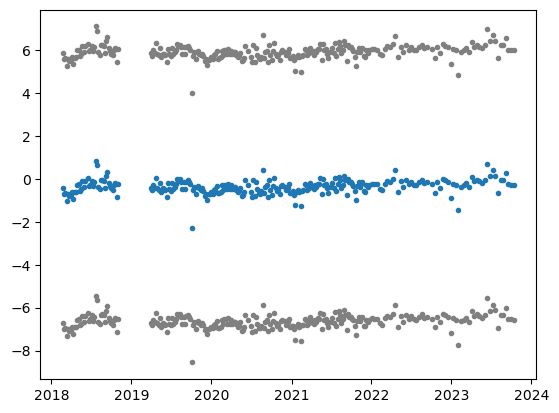

146


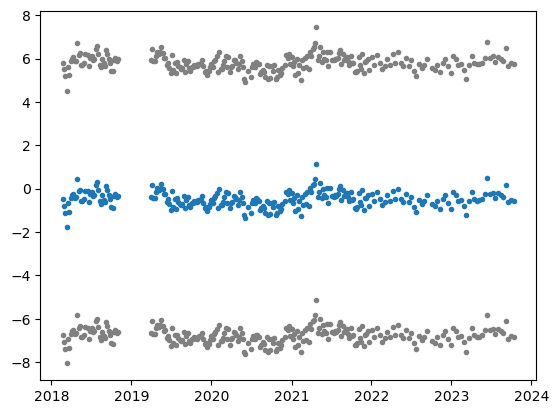

147


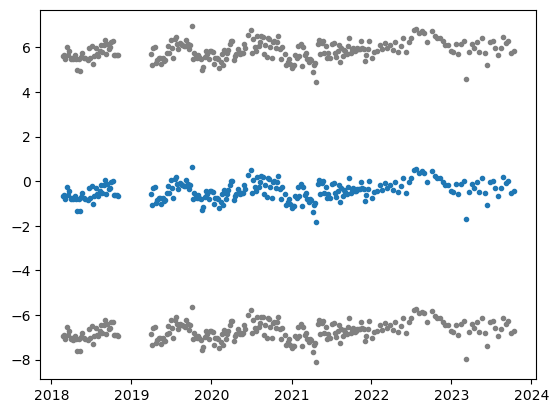

148


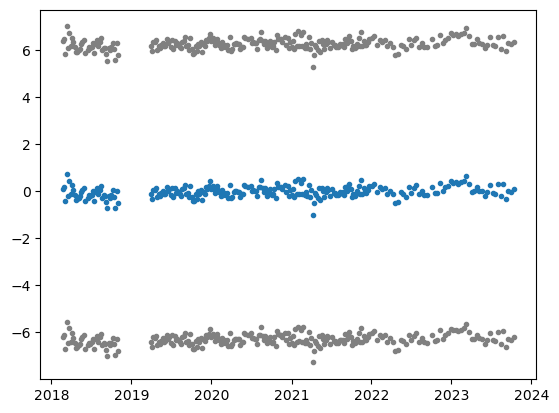

149


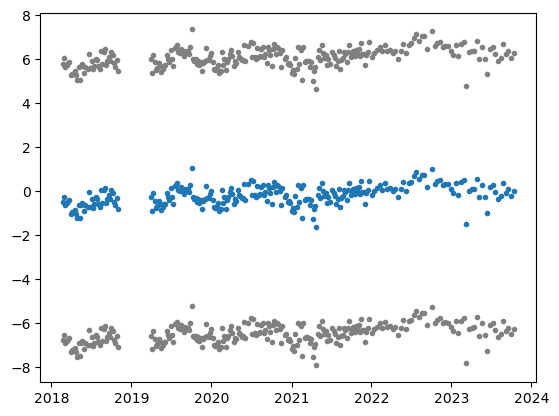

In [212]:
for i in range(150):
    print (i)
    plt.figure()
    plt.plot(dates, arc_phase[i,:], '.')
    plt.plot(dates, arc_phase[i,:] + 2*np.pi, '.', color = 'gray')
    plt.plot(dates, arc_phase[i,:] - 2*np.pi, '.', color = 'gray')
    plt.show()

In [210]:
# Unwrap
values = [1, 3, 6, 10, 15]

# Bereken de verschillen tussen opeenvolgende waarden
differences = np.diff(values)
differences

array([2, 3, 4, 5])

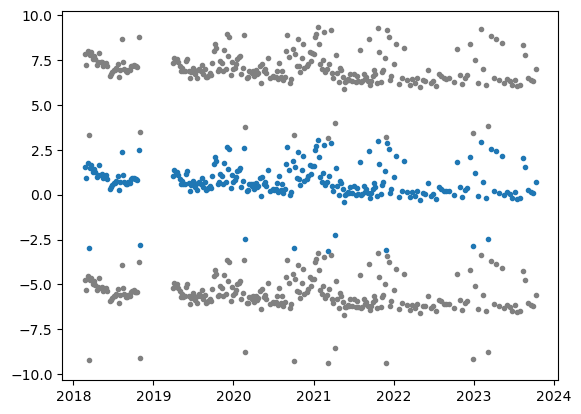

In [213]:
arc_idx = 85

phase_arc_wrap = arc_phase[arc_idx,:]

plt.figure()
plt.plot(dates, arc_phase[arc_idx,:], '.')
plt.plot(dates, arc_phase[arc_idx,:] + 2*np.pi, '.', color = 'gray')
plt.plot(dates, arc_phase[arc_idx,:] - 2*np.pi, '.', color = 'gray')
plt.show()

In [224]:
arc_idx = 85

phase_arc_wrap = arc_phase[arc_idx,:]
diff_arc = np.diff(phase_arc_wrap)
idx_down = np.where(diff_arc>np.pi) + 1
idx_up = np.where(diff_arc<np.pi) + 1

# phase_arc_uwrp = phase_arc_wrap
# phase_arc_uwrp[idx_down] - np.pi
# phase_arc_uwrp[idx_up] + np.pi

plt.figure()
plt.plot(dates, arc_phase[arc_idx,:], '.')
plt.plot(dates, arc_phase[arc_idx,:] + 2*np.pi, '.', color = 'gray')
plt.plot(dates, arc_phase[arc_idx,:] - 2*np.pi, '.', color = 'gray')
plt.show()

plt.figure()
plt.plot(dates[1:], diff_arc, '.')
plt.axhline(np.pi)
plt.axhline(-np.pi)




TypeError: can only concatenate tuple (not "int") to tuple

(array([  3,  41, 132, 157, 162, 200, 234, 240]),)